In [2]:
from skimage import io,filters, morphology, measure, draw,exposure
import matplotlib.pyplot as plt
import numpy as np
import scipy
from scipy import stats
import trackpy as tp
import pandas as pd
from scipy.stats import median_abs_deviation
from scipy.optimize import curve_fit
from sklearn.neighbors import KernelDensity
import seaborn as sns
from scipy.interpolate import make_interp_spline, BSpline
import imageio
from skimage.filters import threshold_otsu,threshold_multiotsu
from scipy.stats import ttest_ind,ttest_rel
import warnings
warnings.filterwarnings('ignore')

In [3]:
PATH = '<PATH/TO/DIR>/WAVE/Fig4DE_S3C_Beads_assay/'

In [4]:
def fill_multi_contours(cells_label_mask_clean, pad):
    num_cells = np.max(cells_label_mask_clean)
    output = np.zeros_like(cells_label_mask_clean)
    
    for target in range(1, num_cells+1):
        output += fill_contours((cells_label_mask_clean==target) * target, pad)
        
    return output

In [5]:
def fill_contours(cells_label_mask_clean, pad):
    return np.pad(np.maximum.accumulate(cells_label_mask_clean, 1),((0,0),(pad,0)), mode='constant')[:, :-pad] & \
           np.pad(np.maximum.accumulate(cells_label_mask_clean[:,::-1],1)[:,::-1],((0,0),(0,pad)), mode='constant')[:, pad:] & \
           np.pad(np.maximum.accumulate(cells_label_mask_clean, 0),((pad,0),(0,0)), mode='constant')[:-pad,:] & \
           np.pad(np.maximum.accumulate(cells_label_mask_clean[::-1,:],0)[::-1,:],((0,pad),(0,0)), mode='constant')[pad:,:]

In [6]:
def seg_cells(image, threshold, sigma,min_size, max_size, plot = True):
    """
    Segment out regions with a given fluorescence threshold in a cell
 
    Parameters
    ----------
    image : 2D array
        Raw tif image (single frame).
    threshold: float
        threshold used for segmentation
    sigma: float
        Standard deviation for Gaussian kernel.The larger the value, the smoothier the gaussian fitting.
    min_size: float
        minimum size of the segmented region
    max_size: float
        maximum size of the segmented region
    plot: bool
        whether or not plot the segmentation image
    
    Returns
    -------
    region_properties: list of RegionProperties
        Each item describes one labeled region with the corresponding attributes. 
    label_mask_clean:2D array 
        Segmentations based on fluorescent intensities of the image. 
        Each integer corresponds to a unique segmentation and 0 is the background.
        
    """
    smooth = filters.gaussian(image,sigma,preserve_range=True)
    cell_mask = smooth > threshold
    label_mask = measure.label(cell_mask)
    region_properties = measure.regionprops(label_mask)  
    label_mask_clean = label_mask.copy()
    for r in region_properties:
        if r.area <= min_size or r.area >= max_size:
            label_mask_clean[label_mask_clean == r.label] = 0
    if plot:
        plt.figure(figsize = (10,10))
        plt.imshow(image)
        plt.contour(label_mask_clean,colors = 'r',linewidths = 0.7)

    region_properties = measure.regionprops(label_mask_clean,intensity_image=image)
    return label_mask_clean,region_properties

In [7]:
def PeakWidth(data,rel_height):
    peaks, _ = find_peaks(data)
    print(rel_height)
    results = peak_widths(data, peaks, rel_height)
    plt.plot(data)
    plt.plot(peaks, data[peaks], "x")

    plt.hlines(*results[1:], color="C3")
    plt.show()
    return results

In [8]:
def find_max_integral(time, signal,spf):
    max_integral = 0
    max_t_start = -1
    max_t_end = -1
    new_sig = []
    for s in signal:
        if s<1:
            new_sig.append(0)
        else:
            new_sig.append(s-1)
    for start_idx in range(len(time)-1):
        start_t = time[start_idx]
        desired_end_t = start_t + 60//spf+1
        if desired_end_t > time[-1]:
            break
        try:
            end_idx = time.index(desired_end_t)
        except Exception:
#             print("time not found: ", desired_end_t)
            continue

        target_sig = new_sig[start_idx:end_idx]
        target_time = time[start_idx:end_idx]

        r = scipy.integrate.simps(np.array(target_sig),np.array(target_time)*spf)
        
        if r > max_integral:
            max_integral = r
            max_t_start = start_idx
            max_t_end = end_idx
    
    return max_integral,max_t_start,max_t_end

In [9]:
def get_top_n_index(cur,n):
    """
    Find out the window of length n that contains highest fluorescent signal
    """
    max_wave = -1
    std_frame = -1
    end_frame = -1
    for j in range(cur.frame.min(),cur.frame.max()-n):
        reg = cur[(cur.frame>=j) & (cur.frame <= j+n)]
        if reg.norm_wave.mean()> max_wave:
            max_wave = reg.norm_wave.mean()
            std_frame = reg.frame.min()
            end_frame = reg.frame.max()
    return max_wave,std_frame,end_frame
                

In [10]:
def get_low_to_high(cur,n,low,high,max_diff):
    """
    Find out first window of length n where the flurescent signal go from less than low to more than high
    """
    for j in range(cur.frame.min(),cur.frame.max()-n):
        reg = cur[(cur.frame>=j) & (cur.frame <= j+n)]
        reg = reg.sort_values('frame')
        reg = reg.reset_index()
        if reg.norm_wave.min()<= low and reg.norm_wave.max()>=high and reg.norm_wave.idxmax()>reg.norm_wave.idxmin():
            return reg.frame.min(),reg.frame.max()
        if reg.norm_wave.max()-reg.norm_wave.min()>=max_diff and reg.norm_wave.idxmax()>reg.norm_wave.idxmin():
            return reg.frame.min(),reg.frame.max()
        else:
            continue
    return -1,-1
    

In [11]:
class Intensity_on_beads:
    def __init__(self, intensity, time):
        self.intensity = intensity
        self.time = time
    

# Extract WAVE complex and Membrane fluorescent intensities on beads

In [12]:
image = io.imread(PATH + 'example_images/221102_500nm_1s_1.tif')

In [12]:
spf = 1


In [13]:
image.shape

(90, 260, 260, 3)

In [14]:
beads = image[:,:,:,1]

In [15]:
mem= image[:,:,:,0]

In [16]:
cells = image[:,:,:,2]

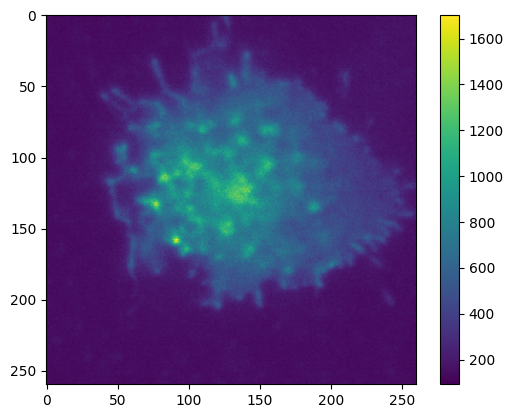

In [17]:
plt.imshow(cells[10])

plt.colorbar()

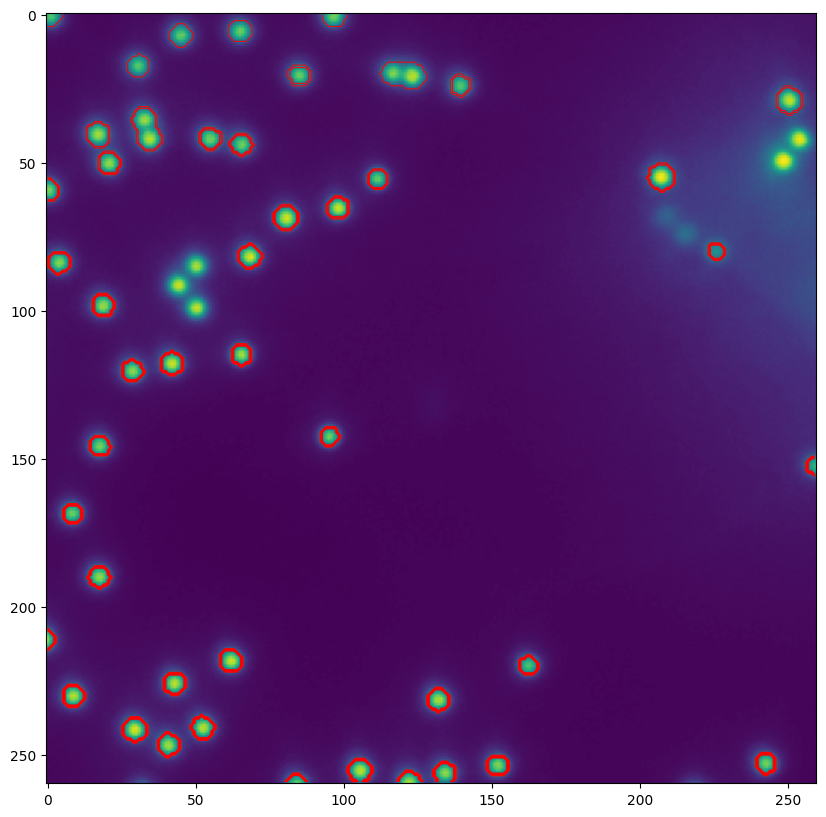

In [18]:
i = 0
label_mask_clean,beads_features= seg_cells(beads[i],threshold_otsu(beads[i])+1000,1,3,100)

for r in beads_features:
    y_center, x_center = r.centroid # note that image coordinates are often given as (y, x) rather than (x, y)
#     ax.text(x_center, y_center, str(r.label), fontweight = 'bold', color = 'white')
plt.show()

In [19]:
features = pd.DataFrame()
for i in range(0,cells.shape[0]):
        beads_label_mask_clean,beads_features = seg_cells(beads[i],threshold_otsu(beads[i])+1000,1,3,100,False)  
        beads_properties = measure.regionprops(beads_label_mask_clean,intensity_image=cells[i])
        mem_properties = measure.regionprops(beads_label_mask_clean,intensity_image=mem[i])
        for j in range(len(beads_properties)):
            y = beads_properties[j].centroid[0]
            x = beads_properties[j].centroid[1]
            features = features.append([{'y': y,
                                         'x': x,
                                         'area':beads_properties[j].area,
                                         'bbox': beads_properties[j].bbox,
                                         'frame': i,
                                         'wave_intensity': beads_properties[j].intensity_mean,
                                         'perimeter':beads_properties[j].perimeter,
                                         'mem_intensity': mem_properties[j].intensity_mean},])


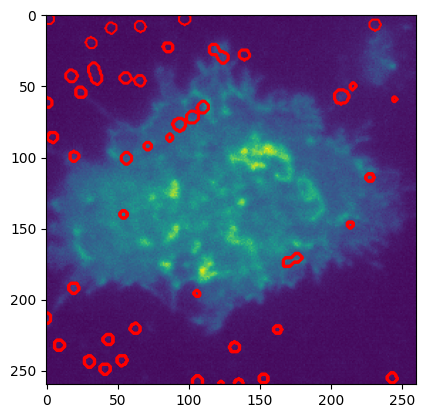

In [20]:
# plt.contour(cells_label_mask_clean)
plt.contour(beads_label_mask_clean,colors = 'red')
plt.imshow(cells[-1])

In [21]:
t = tp.link_df(features,15, memory=3)

Frame 89: 46 trajectories present.


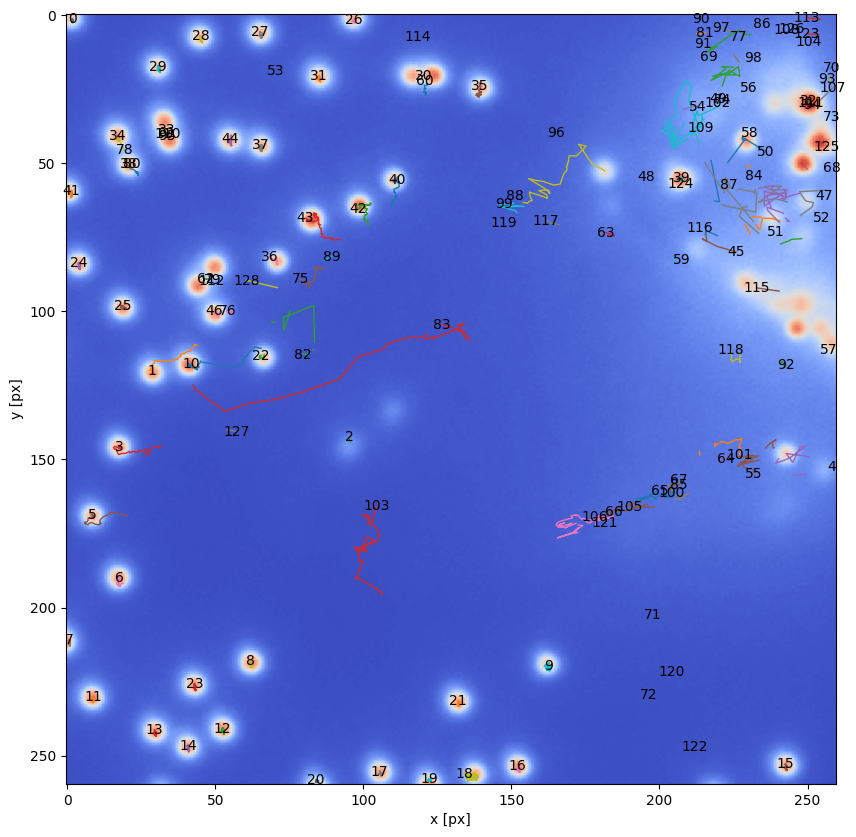

In [22]:
plt.figure(figsize=(10,10))
plt.imshow(beads[10],cmap = 'coolwarm')
tp.plot_traj(t,label = True)
plt.show()

In [26]:
# Calculate the background for WAVE and membrane 
n = 1
# n += 1
wave_background = []
MEM_background = []
t = t.sort_values('particle')
for i in np.unique(t.particle):
    particle = t[t.particle == i]
    for frame in particle.frame:
        cur = particle[particle.frame == frame]
        bbox = cur.bbox[0]
        width = (bbox[2]-bbox[0]+bbox[3]-bbox[1])//2
        if bbox[0]>=width and bbox[2]+width<512 and bbox[1]-width>=0 and bbox[3]+width<512:
            cell_background = (cells[frame,bbox[0]-width:bbox[0],bbox[1]-width:bbox[3]+width].mean()\
                            +cells[frame,bbox[0]:bbox[2],bbox[1]-width:bbox[1]].mean()\
                            +cells[frame,bbox[0]:bbox[2],bbox[3]:bbox[3]+width].mean()\
                            +cells[frame,bbox[2]:bbox[2]+width,bbox[1]-width:bbox[3]+width].mean())/4
            mem_background = (mem[frame,bbox[0]-width:bbox[0],bbox[1]-width:bbox[3]+width].mean()\
                            +mem[frame,bbox[0]:bbox[2],bbox[1]-width:bbox[1]].mean()\
                            +mem[frame,bbox[0]:bbox[2],bbox[3]:bbox[3]+width].mean()\
                            +mem[frame,bbox[2]:bbox[2]+width,bbox[1]-width:bbox[3]+width].mean())/4
            wave_background.append(cell_background)
            MEM_background.append(mem_background)
        else:
            t = t[t.bbox !=bbox]
t['wave_background'] = wave_background
t['mem_background'] = MEM_background
t['cell'] = n

In [27]:
t['norm_wave'] = t['wave_intensity']/t['wave_background']
t['norm_mem'] = t['mem_intensity']/t['mem_background']
t['norm_sig'] = t['norm_wave']/t['norm_mem']

In [1587]:
# full_t = pd.DataFrame()
full_t = full_t.append(t)

In [1588]:
full_t.to_csv(PATH + "beads_200_vs_500/full_data_500nm.csv")

# Plot WAVE and membrane signal on beads over time

In [13]:
full_t_500 = pd.read_csv(PATH + 'csv_data/full_data_500nm.csv')

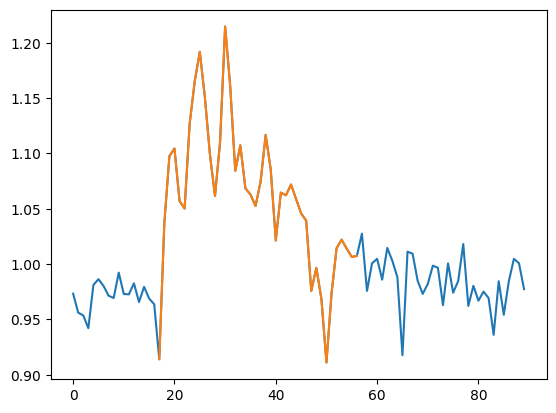

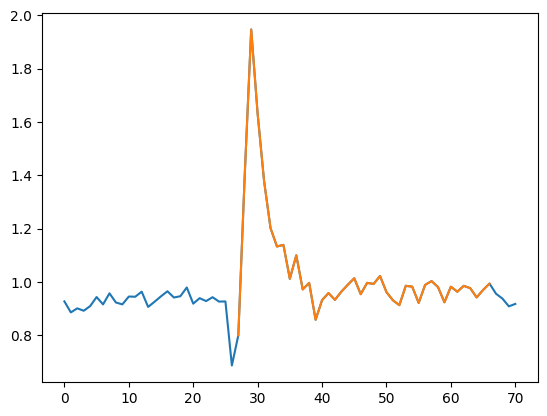

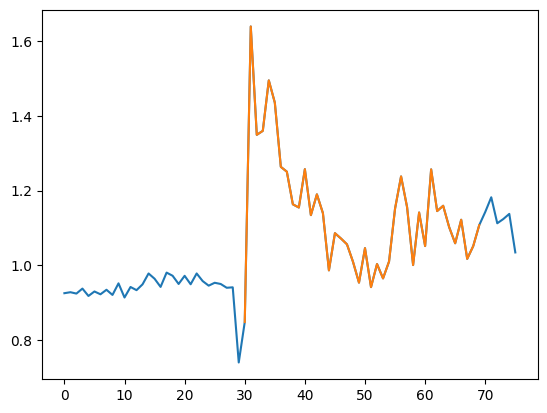

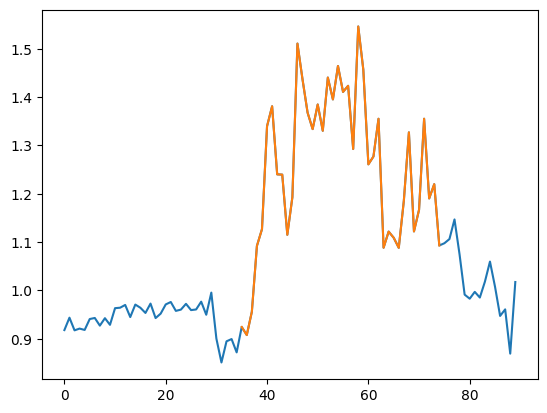

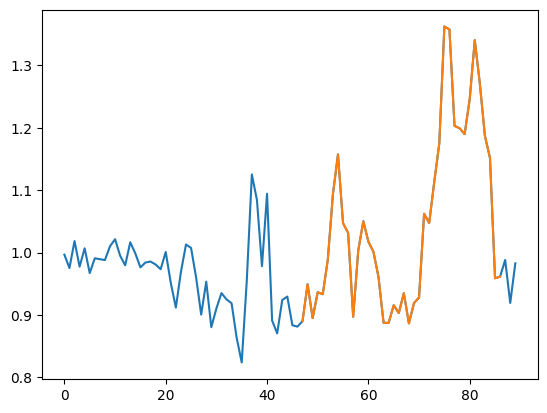

...

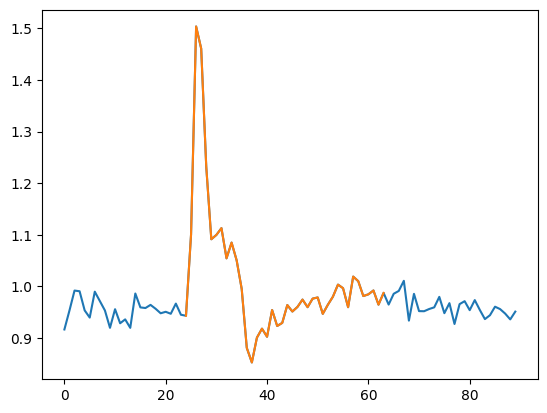

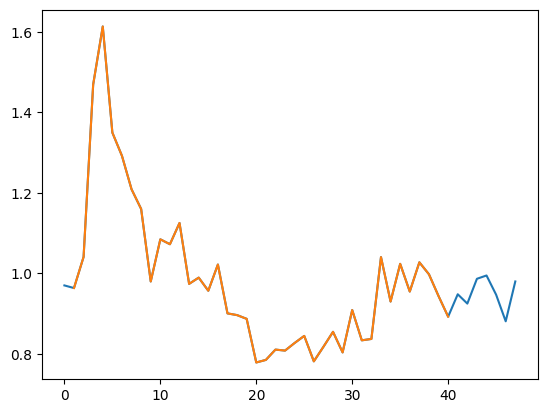

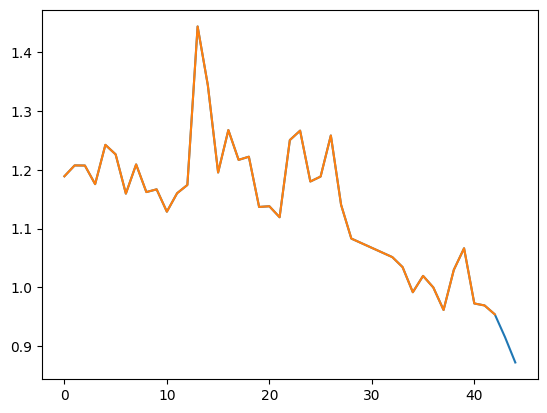

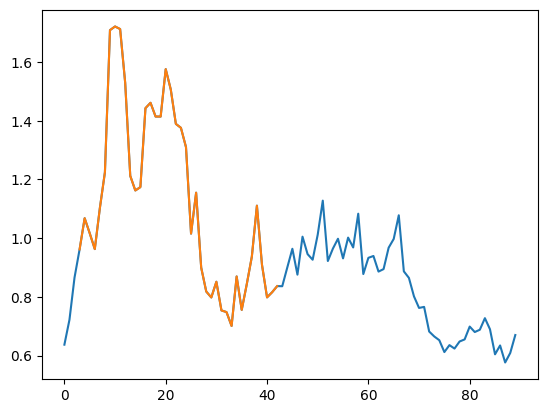

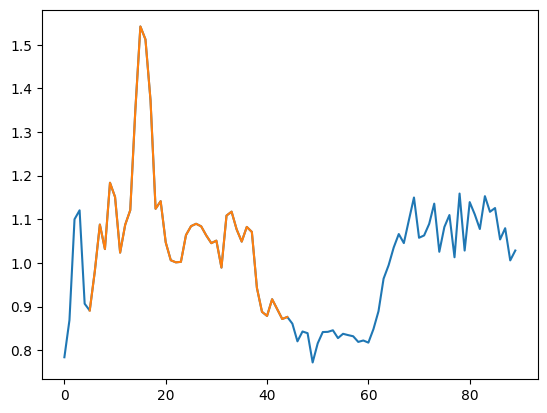

In [14]:
# Select tracks for plotting 
dynamics = []
mem_dynamics = []
wave_dynamics = []
for c in np.unique(full_t_500.cell):
    t = full_t_500[full_t_500.cell == c]
    for i in np.unique(t.particle):
        cur = t[t.particle == i]
        cur = cur.sort_values('frame')
        if len(cur)>= 40 and np.max(cur.norm_wave)>1.3:  
            std,end = get_low_to_high(cur,15,1,1.3,0.3)
            cur_r = cur[(cur.frame>std)]
            if std != -1:
                cur_r = cur_r.iloc[0:40]
                n = len(cur_r[cur_r.norm_sig>1])
                max_wave,std,end = get_top_n_index(cur_r,n)
                cur_r = cur[(cur.frame>std-2)]
                cur_r = cur_r.iloc[0:40]
                if len(cur_r) >=40 and std != -1:
                    dynamics.append(np.array(cur_r.norm_sig))
                    mem_dynamics.append(np.array(cur_r.norm_mem))
                    wave_dynamics.append(np.array(cur_r.norm_wave))
                    plt.plot(cur.frame,cur.norm_sig)
                    plt.plot(cur_r.frame,cur_r.norm_sig)
                    plt.show()

In [15]:
dynamics_500 = np.array(dynamics)
mem_500 = np.array(mem_dynamics)
wave_500 = np.array(wave_dynamics)

In [16]:
len(dynamics_500)

169

In [17]:
full_t_200 = pd.read_csv(PATH + 'csv_data/full_data_200nm.csv',index_col = 0)

6 16
5 15
19 29
10 20


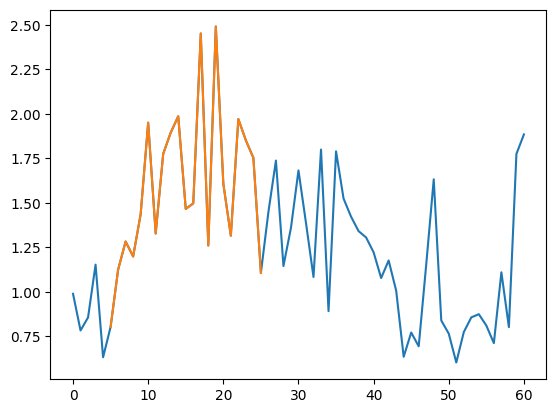

2 12
6 13
14 24
7 17
7 17
8 18
10 20
1 11
10 20
23 33


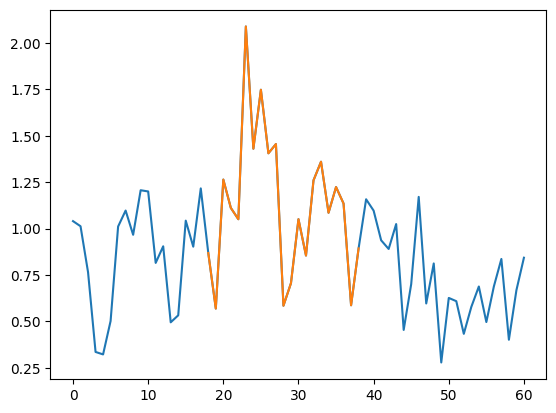

17 27
23 33


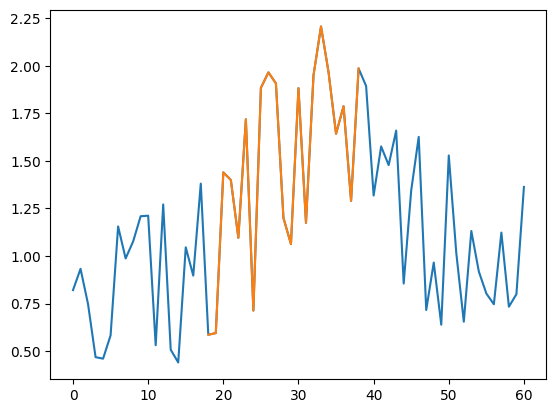

1 11
3 13
49 59
11 21
6 16
6 16


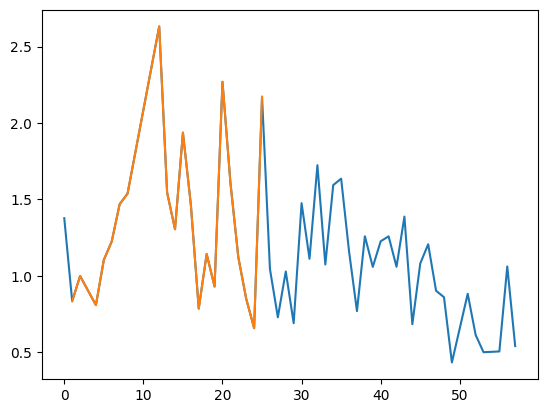

6 16
10 20
48 58
45 55
6 16
26 36
8 18
14 24
20 30


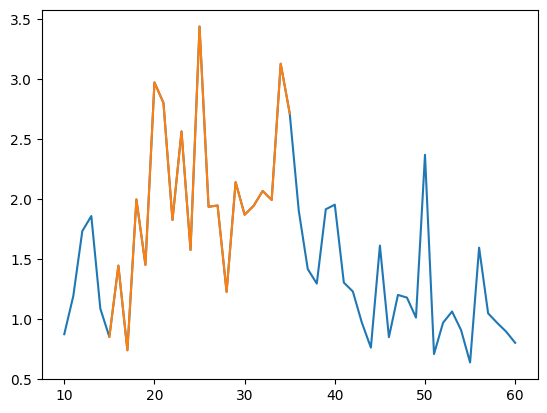

22 32
14 24
26 36
28 38
31 41


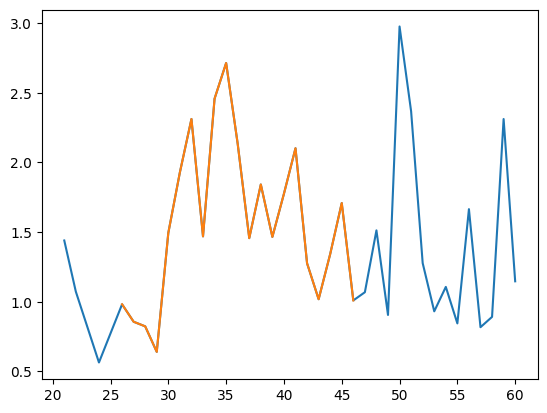

31 41
28 38
39 49
49 59
31 41


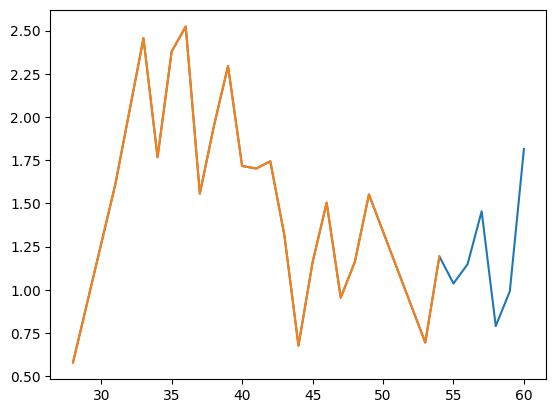

49 59
45 55
45 55
9 19
5 15


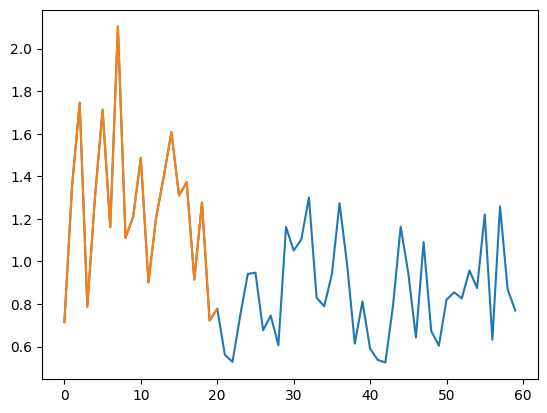

5 15


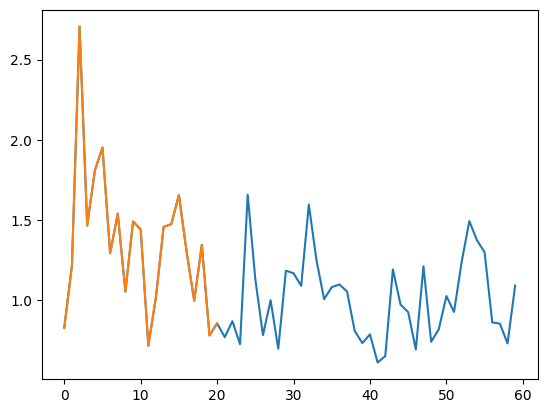

8 18


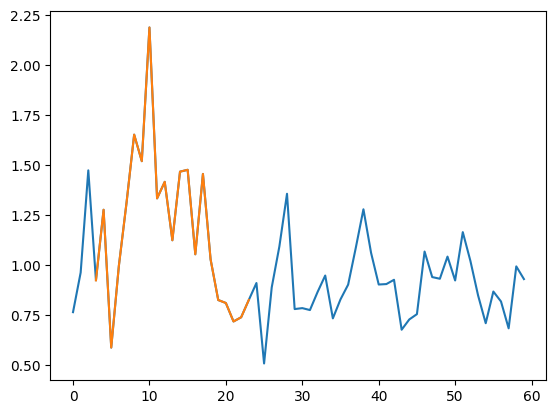

10 19
5 15


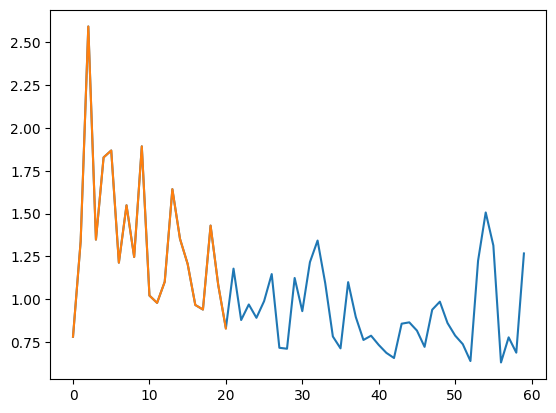

5 15


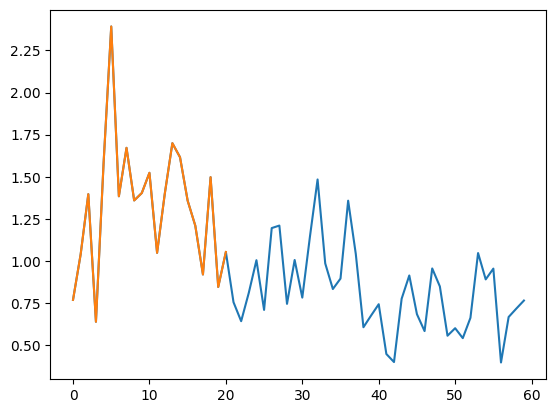

5 15


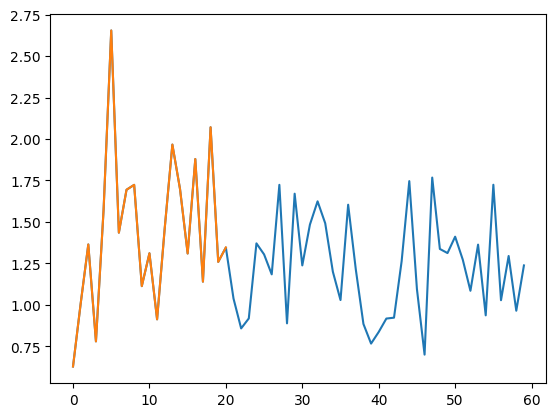

5 15


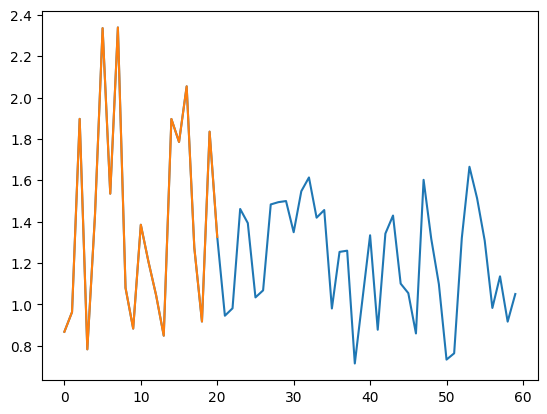

7 17
10 20
7 17
5 15


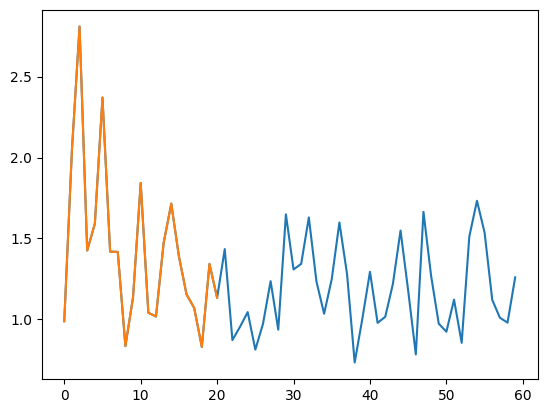

8 18
8 18


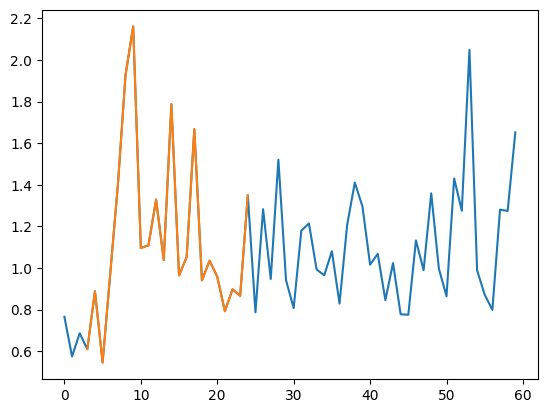

14 24


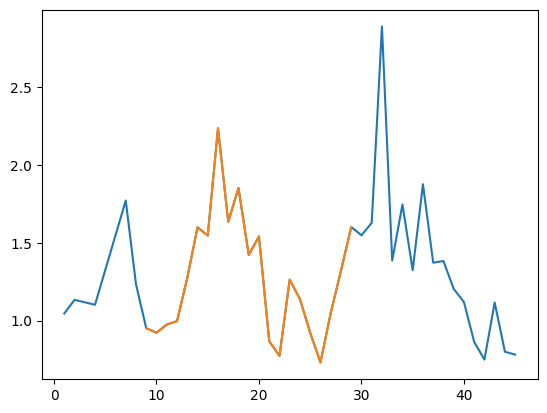

10 20
10 20
10 20
12 22
12 22


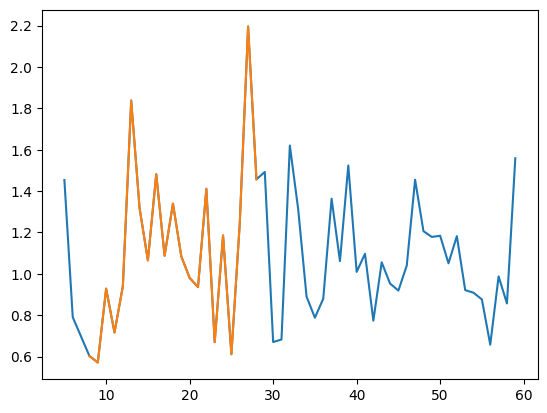

14 24
13 23
48 58
10 20
14 24


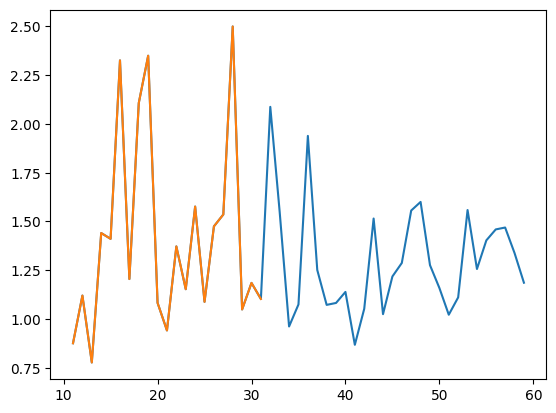

22 32
14 24
27 37


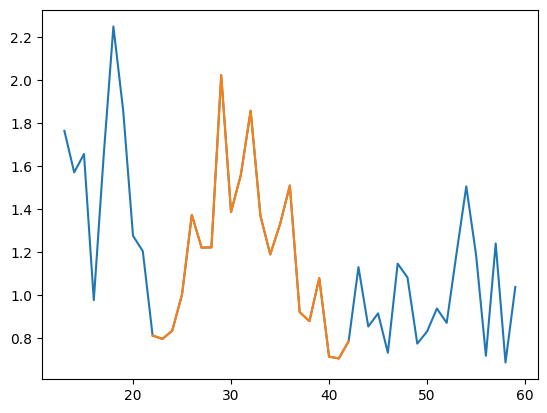

26 36


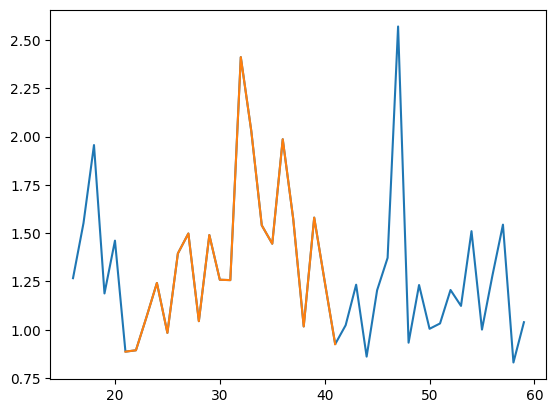

26 36
27 37


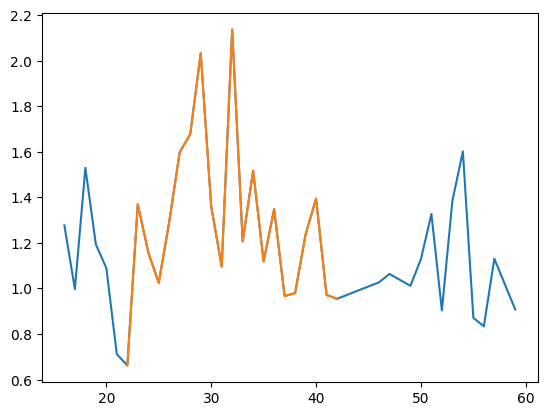

25 35
26 36
38 48
28 38
34 44
29 37
29 39


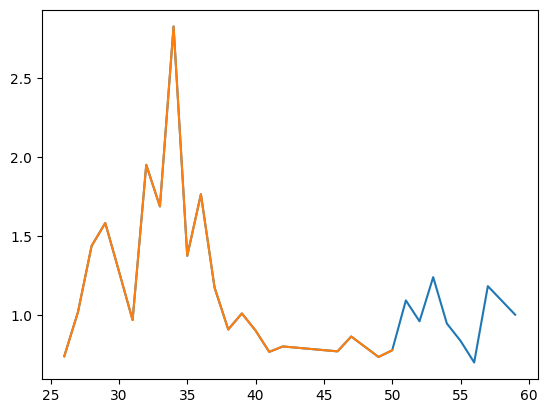

36 46
47 57
46 56
49 58
5 15
2 12
8 18
6 16


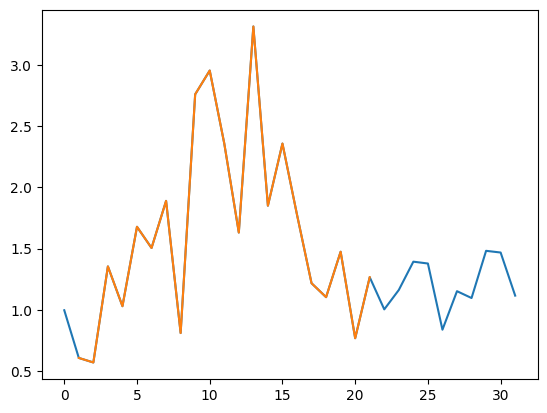

4 14
4 14
5 15
6 16
3 13
6 16


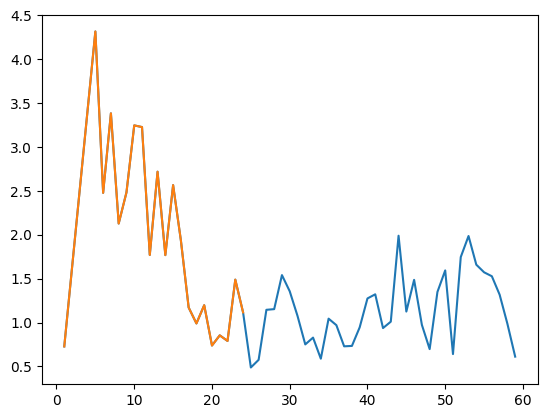

43 53


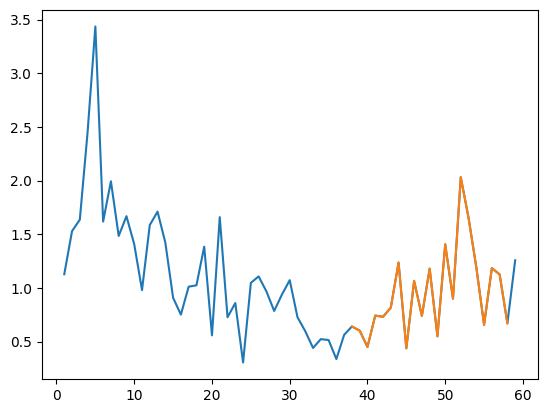

5 15
15 25
5 15
19 29
9 19
6 16
8 18
14 24
19 29
15 25
17 27
15 25
14 24
48 58
23 33
9 19
14 24
23 33
18 28
21 31
19 29
19 29
21 31


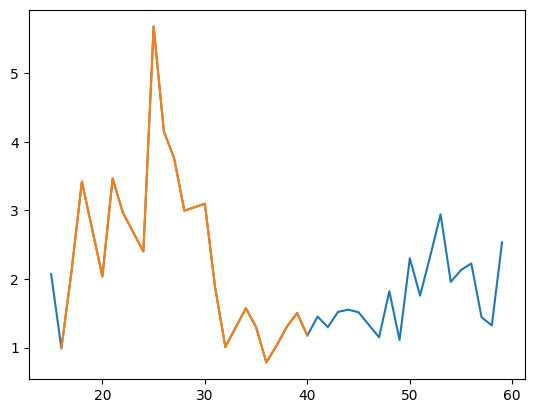

26 36
48 58
32 42
45 55
48 58
9 19
17 27


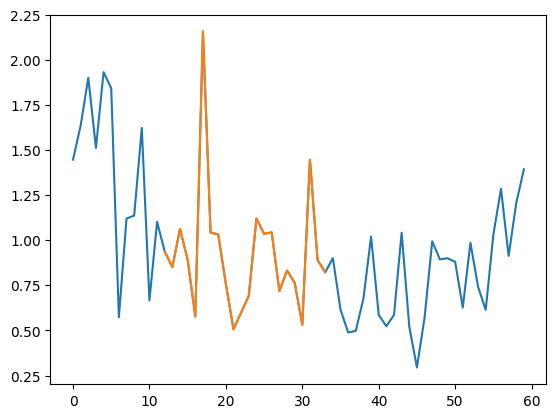

15 25


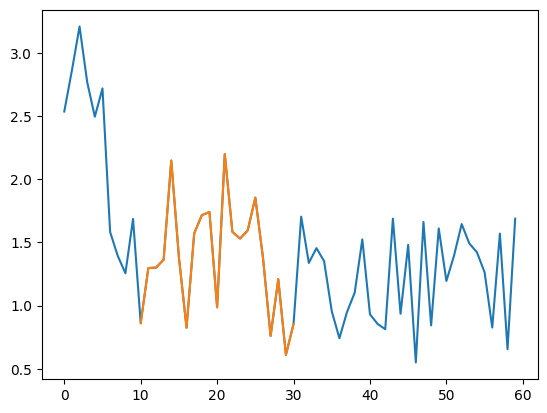

14 24
15 24
2 12
10 20
6 16
4 14
1 11
4 14
18 28
2 12
21 31


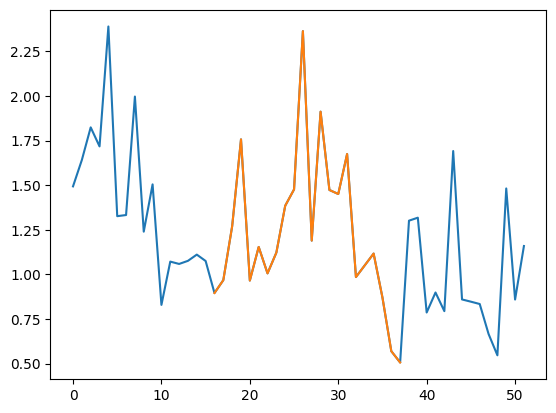

3 13
1 11
8 18


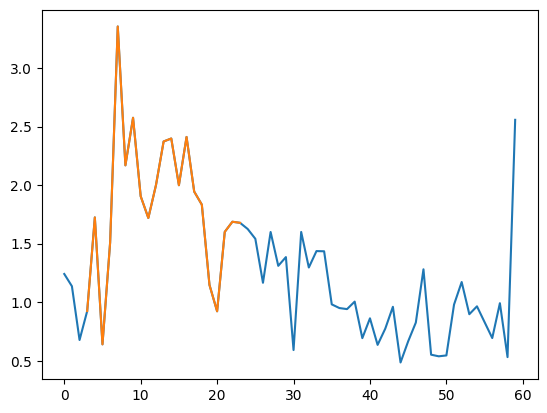

21 31
19 29
18 28
2 12


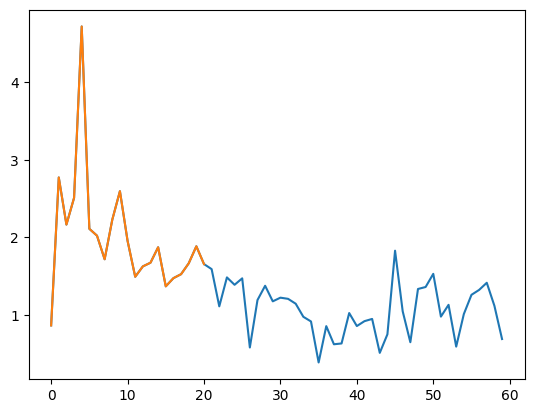

1 11
2 12
4 14


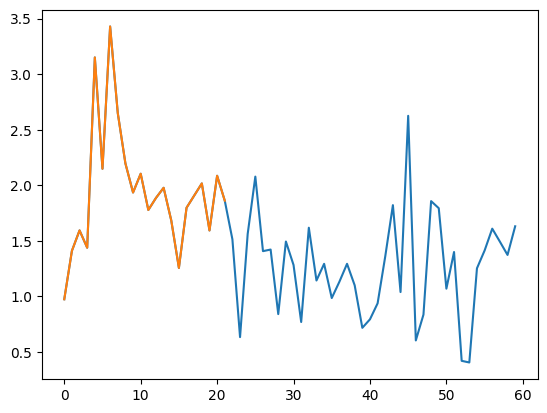

1 11
14 24


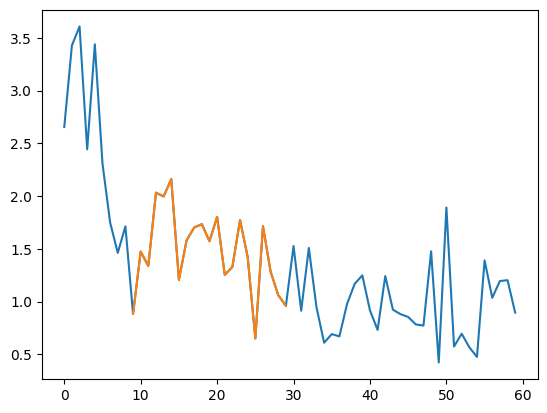

14 24
18 28
14 24
14 24
3 13
3 13
2 12
4 14
19 29
4 14
5 15
5 15
7 17
12 22
4 14
10 20
24 34
47 57
16 26
12 22
11 21
18 28
25 33
13 23
22 32
14 24
24 34
39 49
16 26
19 28
18 28
38 48


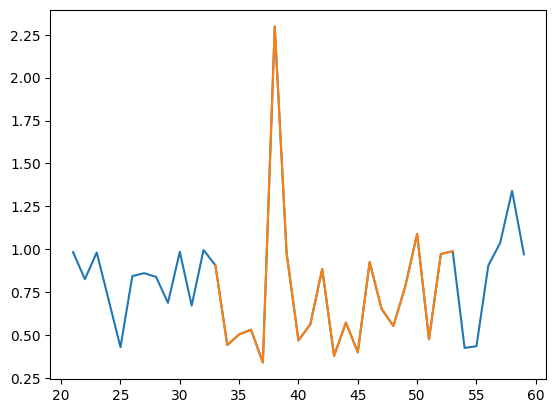

38 48


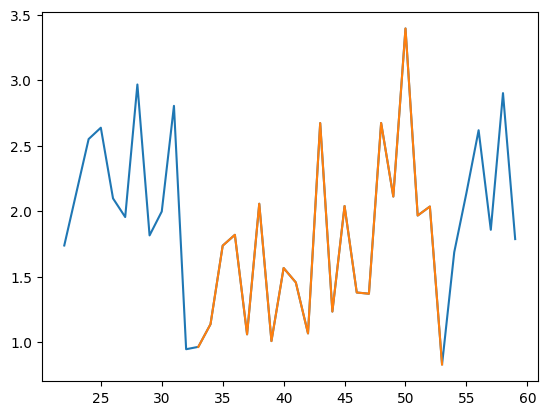

27 37
30 40
38 48
39 49
30 40
48 58
40 50


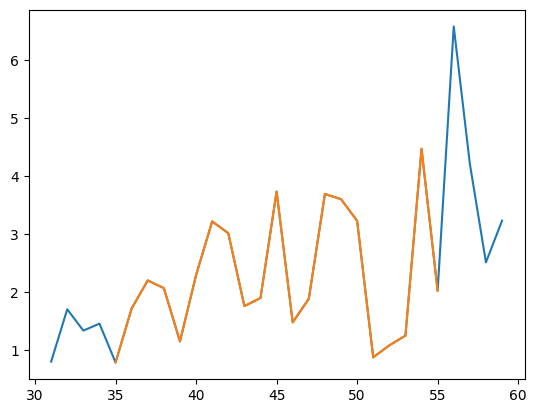

5 15
1 11
1 11
2 12
7 17
10 20
16 26
1 11
7 17
14 24
29 39
10 20
10 20
2 12


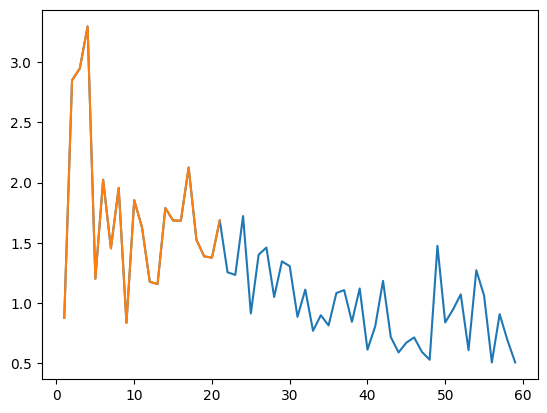

14 24
11 21
13 23
5 15
14 24
15 25
16 26
15 25


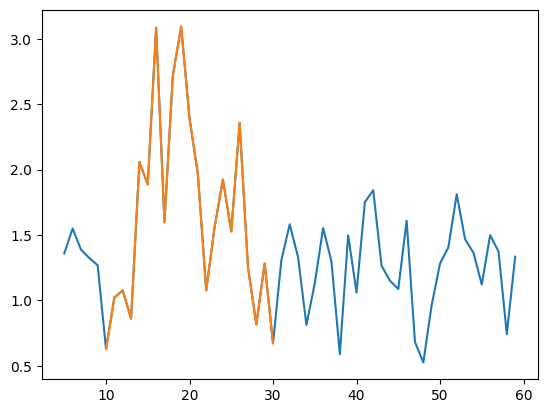

20 30
20 30
14 24
16 26
22 32
13 23
29 39
25 35
42 51
36 46


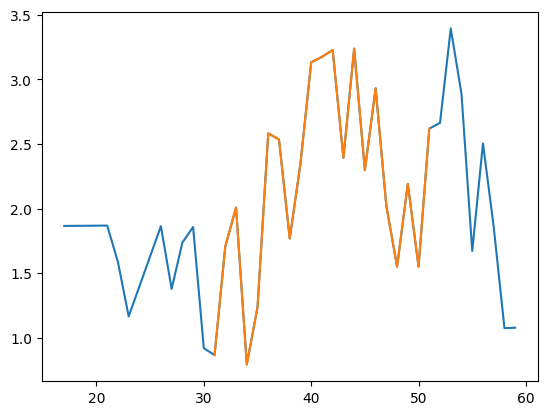

29 39
48 58
37 47
36 46
5 15
4 14
4 14
3 13
16 26


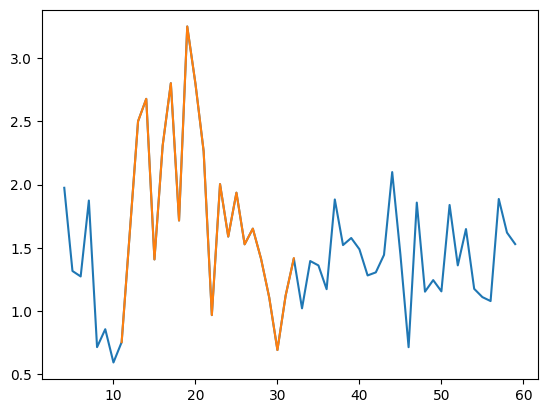

18 28
18 28
19 29


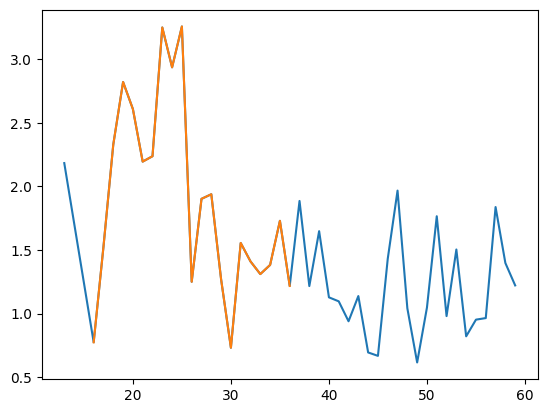

23 33
31 41
36 46


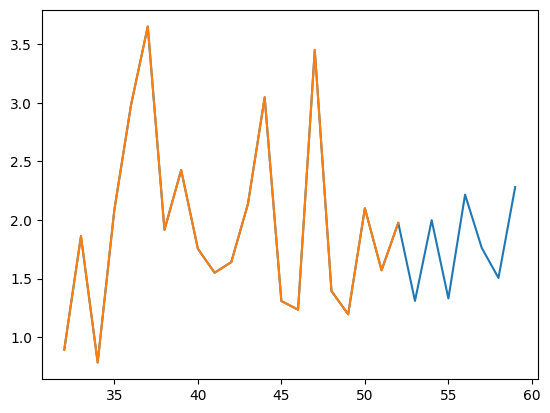

38 48
12 22
7 17
6 16
2 12
9 19
6 16


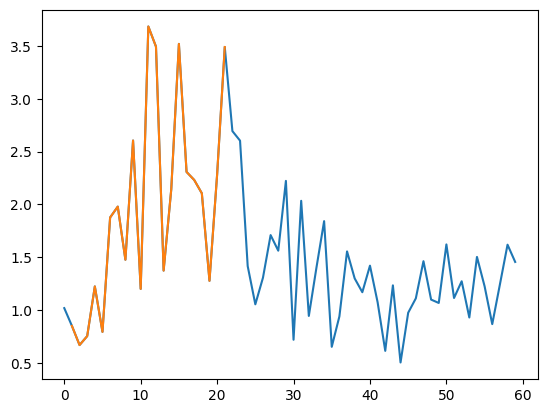

8 18
5 14
10 20
4 14


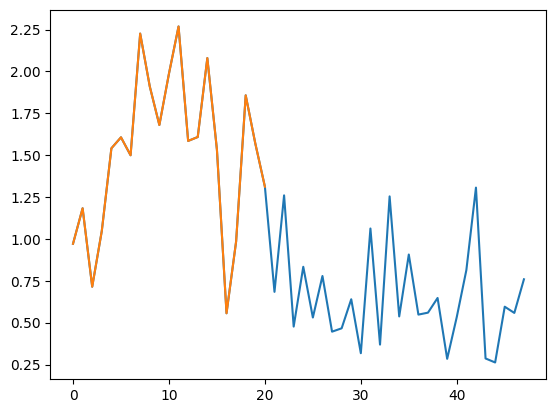

5 15


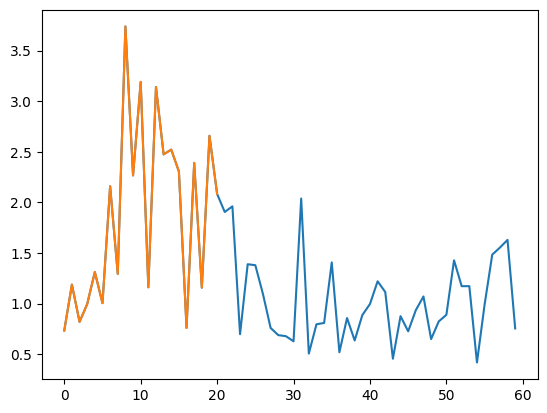

9 17
6 16


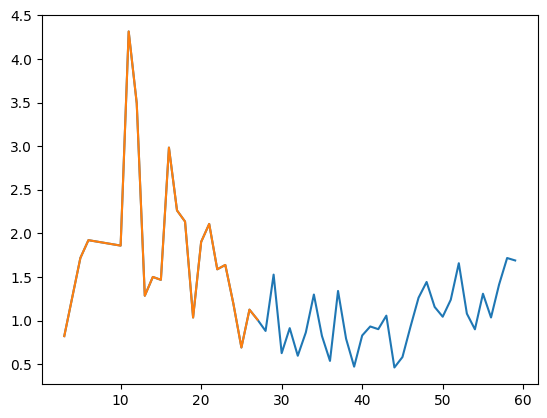

18 28
16 26
12 22
16 26
14 24
9 19
15 25
11 21
12 22
12 22
21 31
21 31
16 26
21 31
48 58
18 28
17 27
28 38


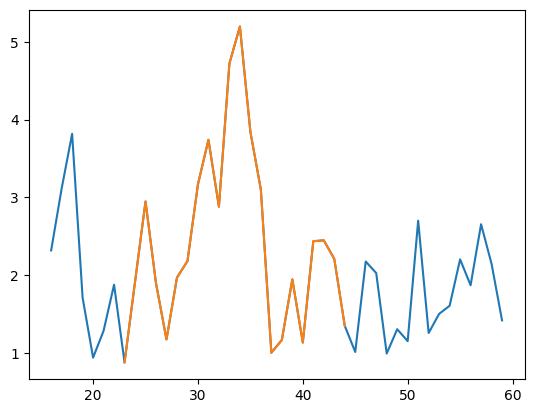

18 28
31 41


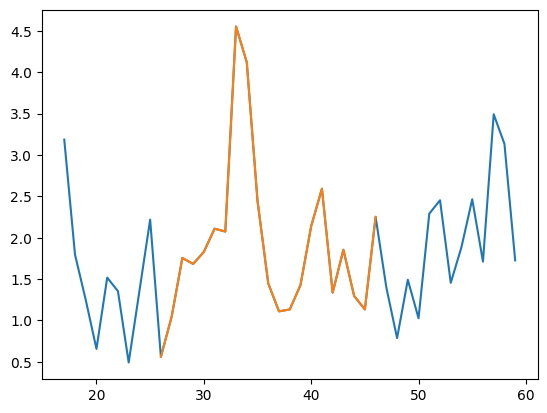

30 40
41 51
32 42


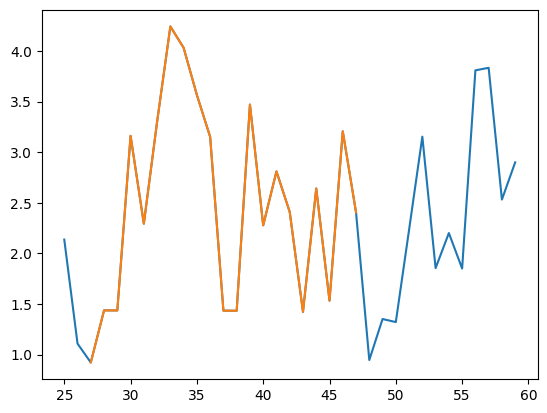

18 28


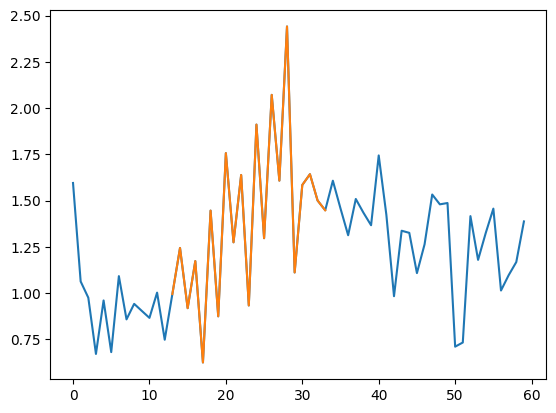

24 34


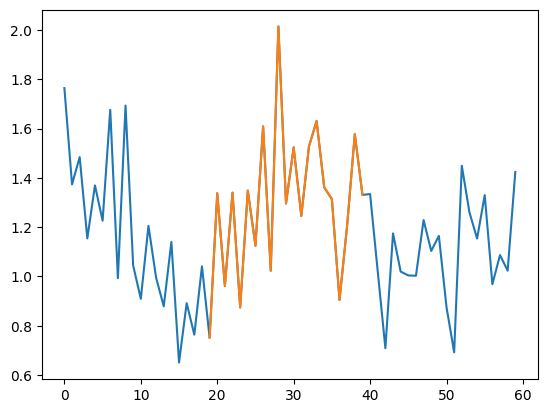

24 34


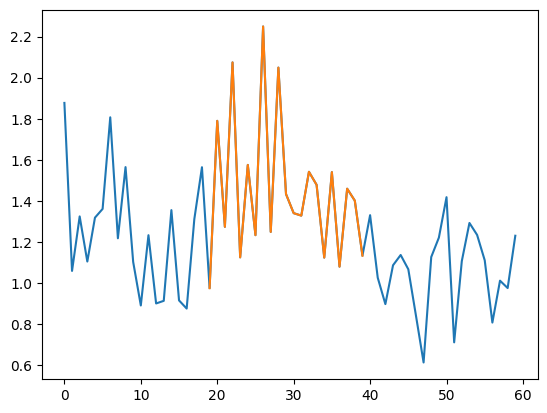

21 31
4 14
20 30
18 28
20 30
18 28
18 28


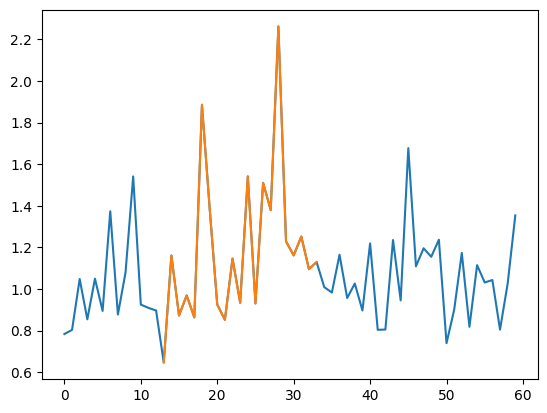

12 22
30 40
25 35
25 34
23 33
23 33
24 34
4 14
2 12


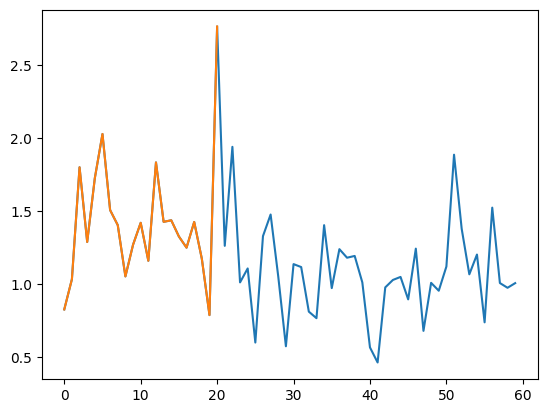

2 12
1 11
1 11


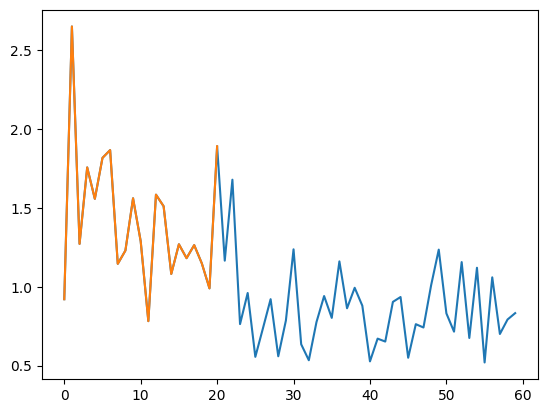

1 11


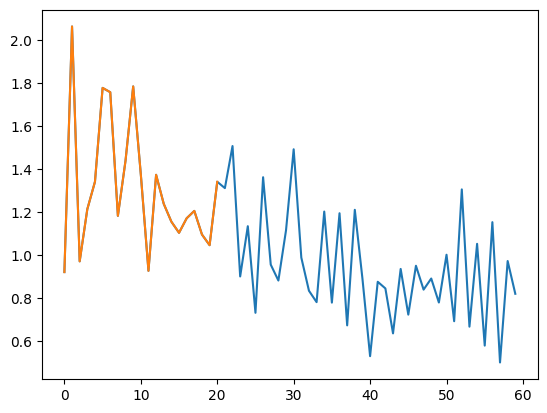

1 11


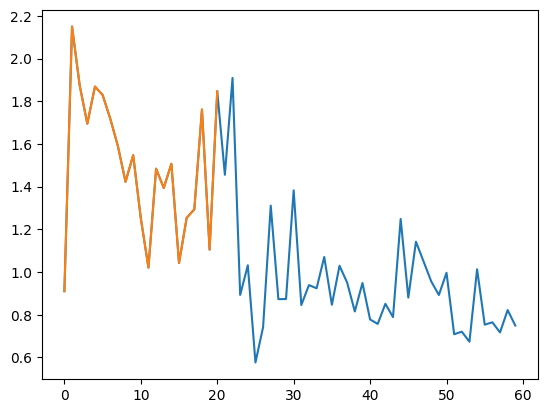

3 13
12 22


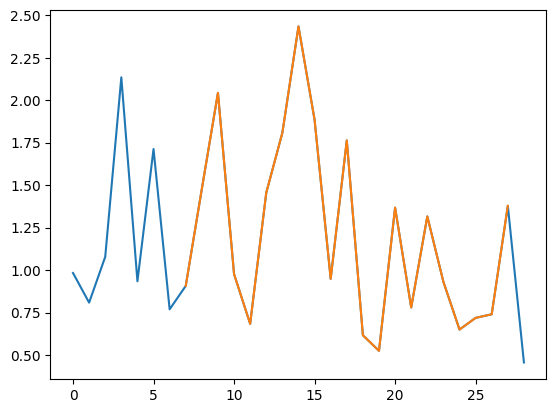

6 16
2 12
7 17


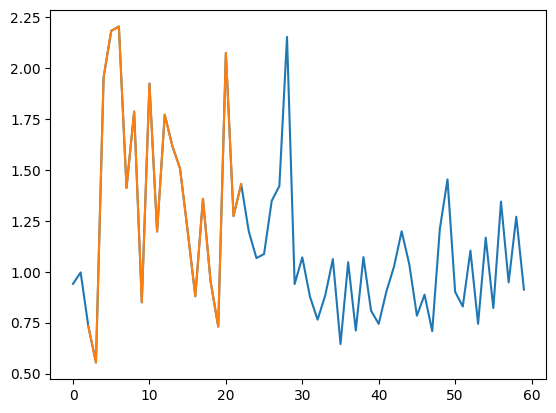

4 14


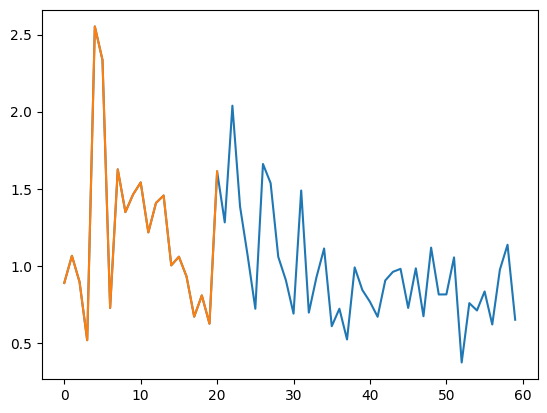

8 18


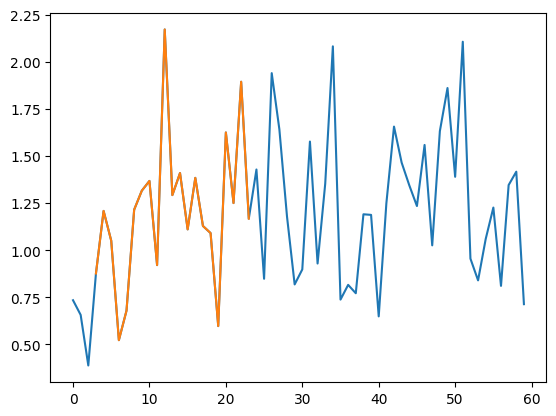

10 20
16 26


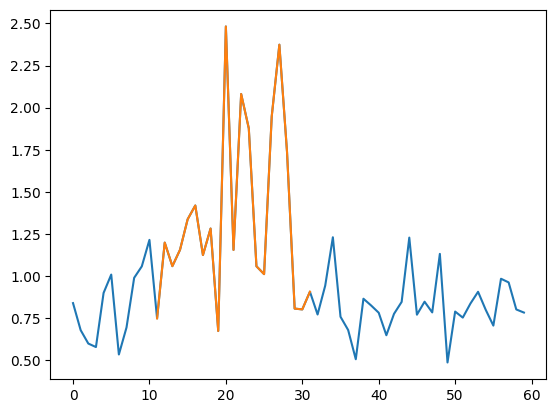

7 17


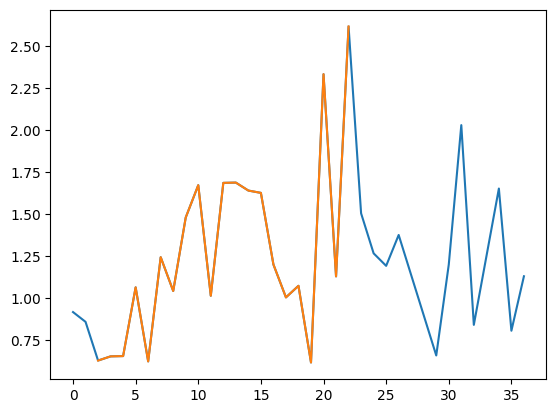

19 29


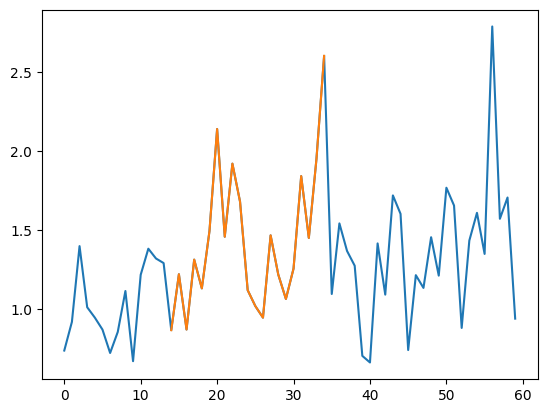

14 24


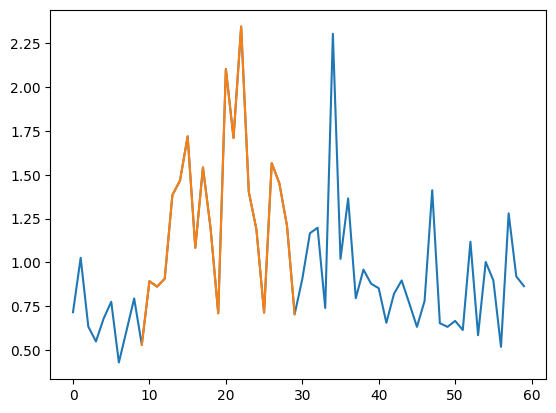

39 49
20 30
20 30
13 23


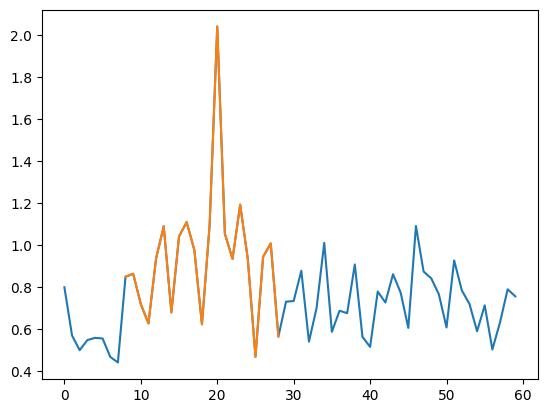

13 23
13 23
13 23
41 49
6 16


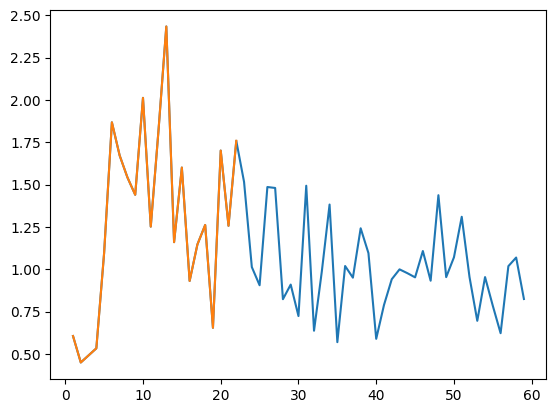

15 25
42 52


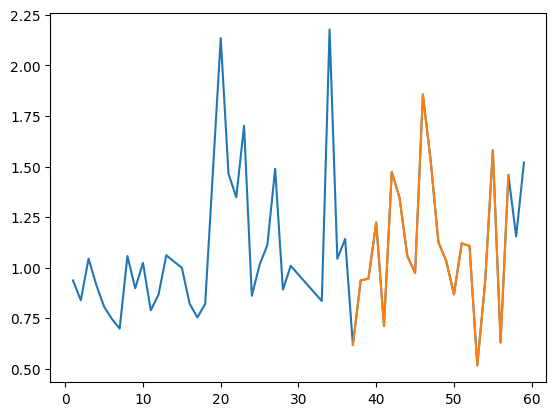

24 34
15 25
15 24


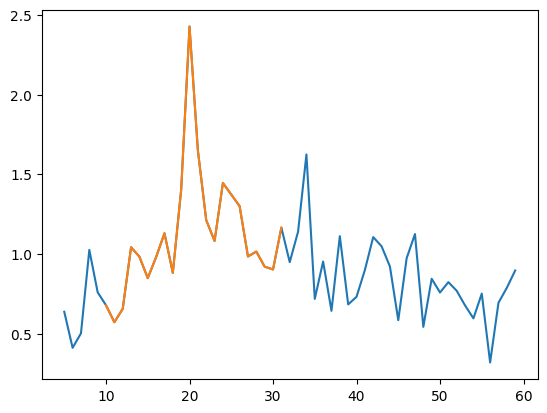

33 43
27 37
13 23
14 24
24 34
13 23
21 31
43 53
25 35
15 25
17 27
30 40
39 49
26 36
42 51
39 49
36 46
29 39
38 48


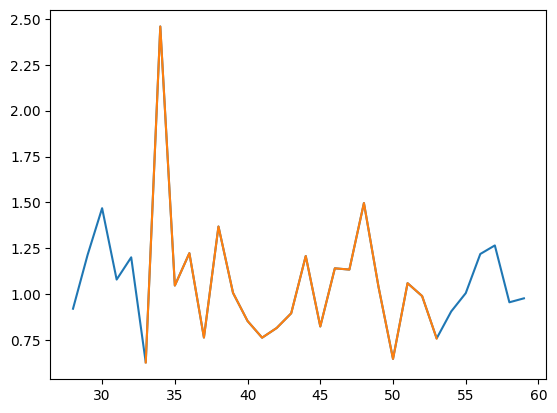

31 41
41 51
32 42
47 57
14 24
3 13


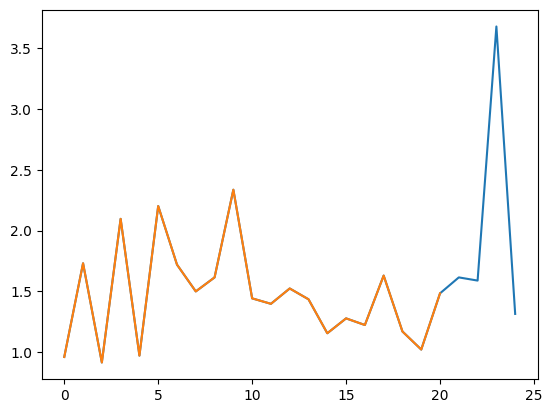

17 27
21 31
31 41
15 25
17 27
21 31
30 40
25 35
30 40
33 43
42 52
46 56


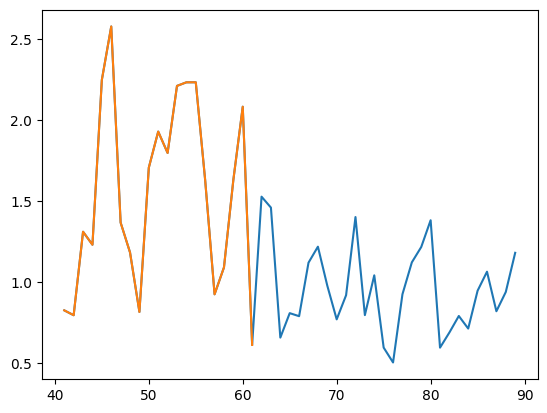

49 59
3 13
12 22
9 19
14 24
8 18
7 17


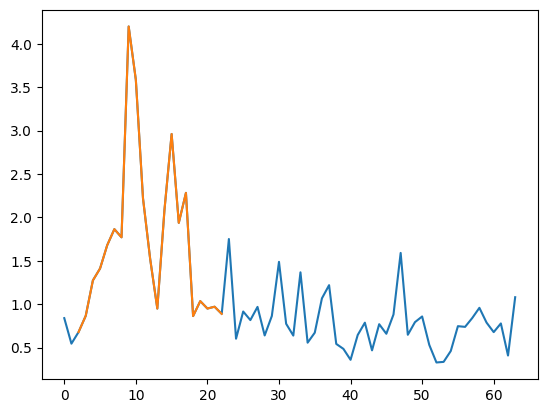

5 15
2 12


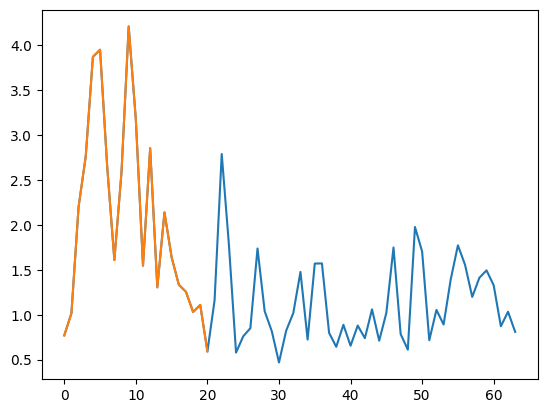

1 11


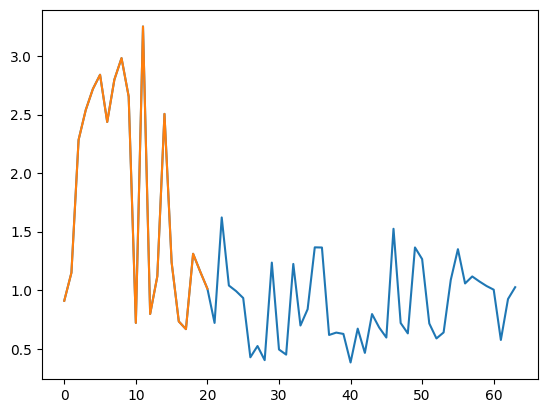

5 15
4 14


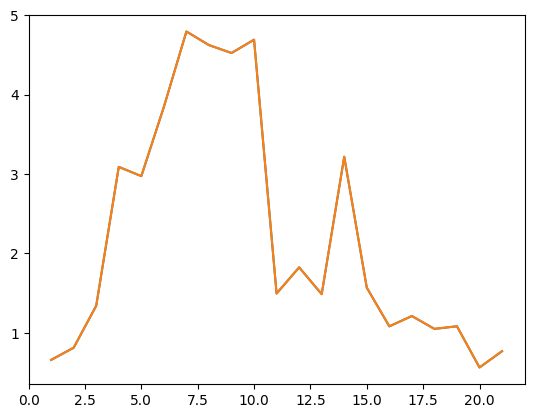

5 15


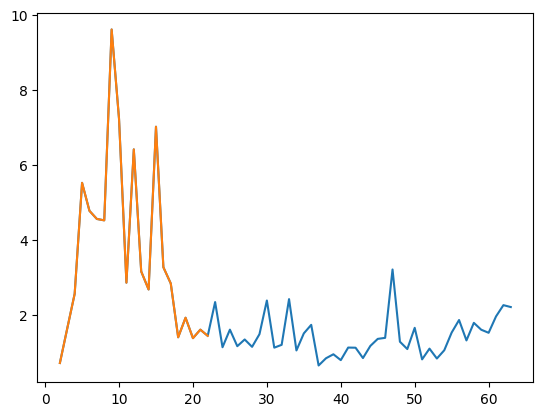

7 17
6 16
5 15
5 15
6 16
6 16
8 18
8 18
8 18
8 18
9 19
8 18
9 19
9 19
12 22
9 19
13 23
13 23
14 24
13 23
13 23
20 30
16 26
23 33


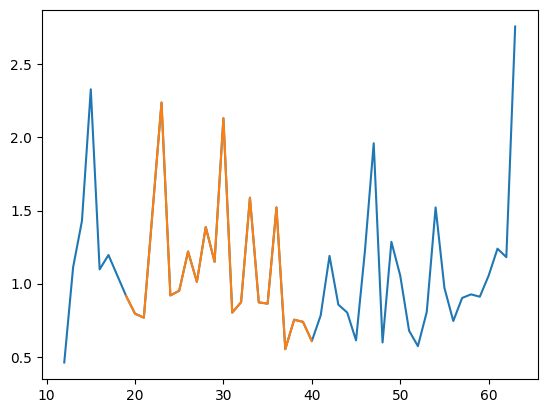

14 24


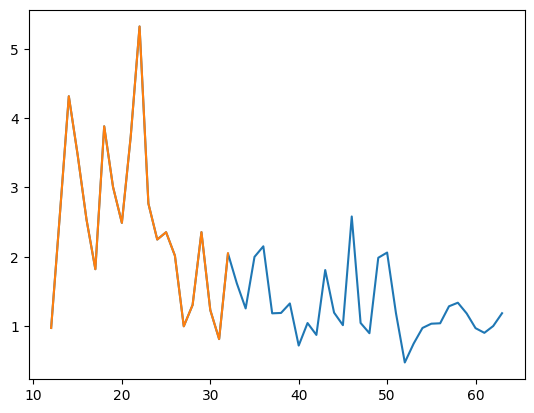

15 25
20 30
23 33
22 32
40 50
32 42
40 50
52 62
39 49


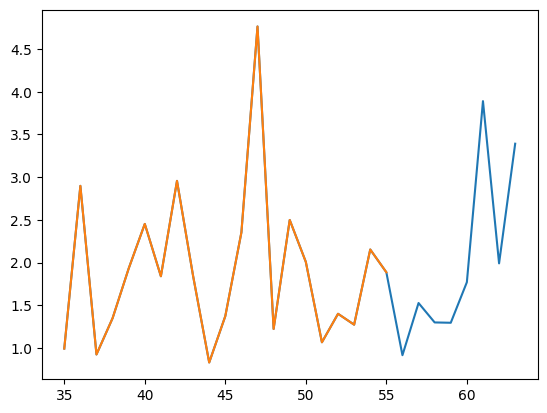

52 62
15 25
5 15
5 15


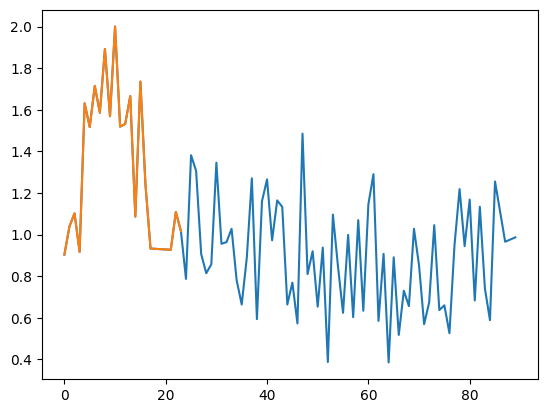

4 14
5 15
12 22
12 22
5 15


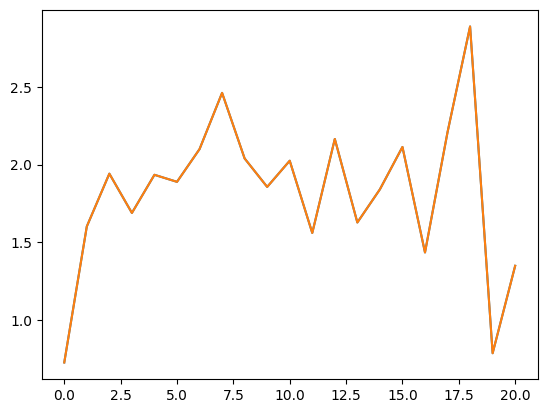

5 15
4 14


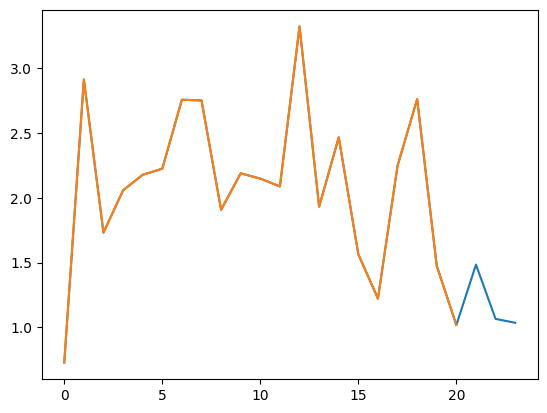

9 19
4 14


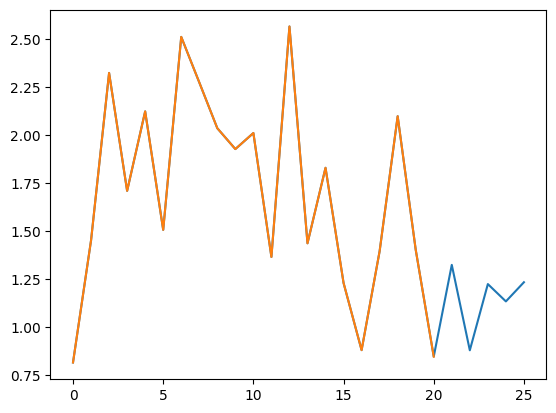

12 22
8 18


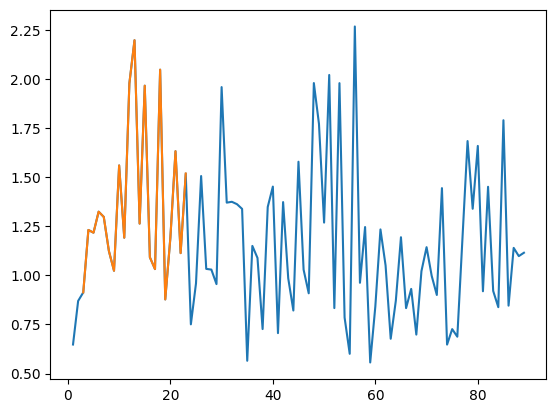

11 21
23 33
20 30
26 36
18 28
20 30
38 48
21 31
24 34
29 39
26 36
26 36


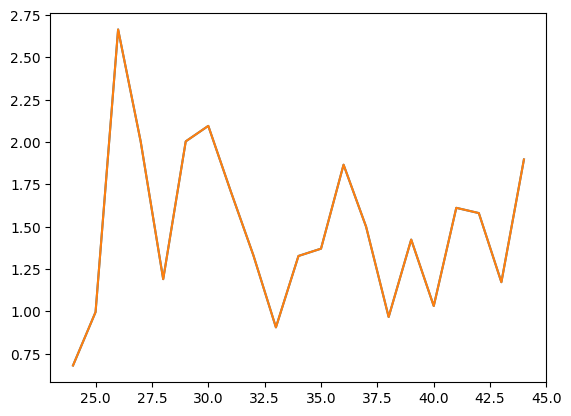

27 37
31 41
46 56
39 49
39 49


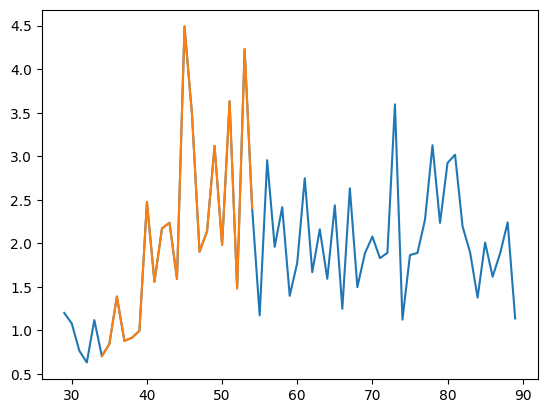

39 49
49 59
47 57


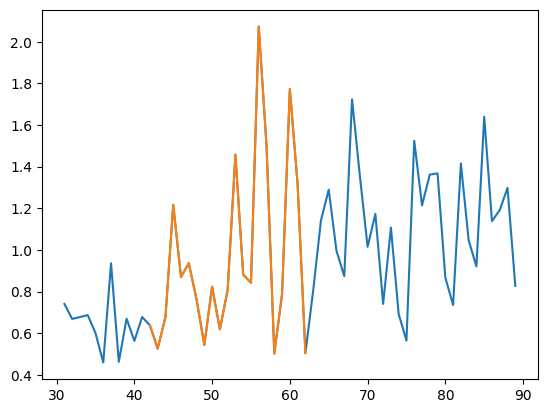

45 55
45 55
36 46
53 60
49 59


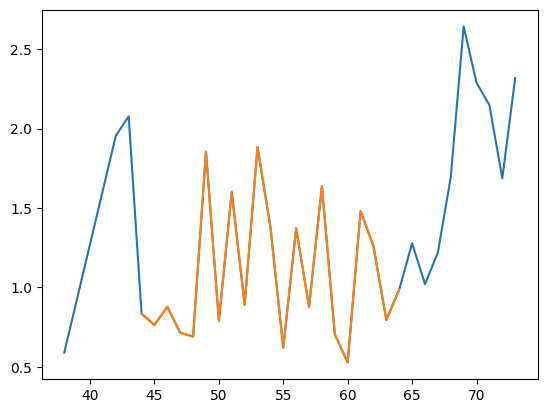

49 59


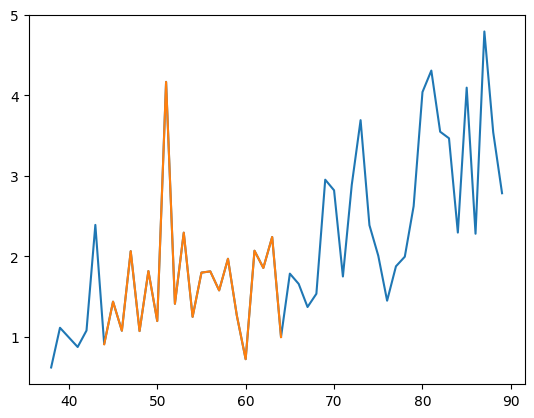

47 57
56 66
48 58
47 57


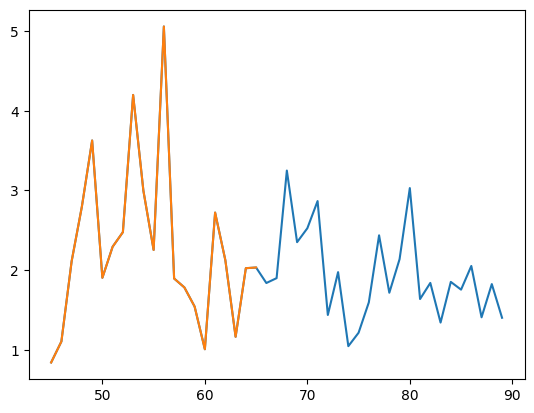

77 83
57 67
65 75
77 87
71 81


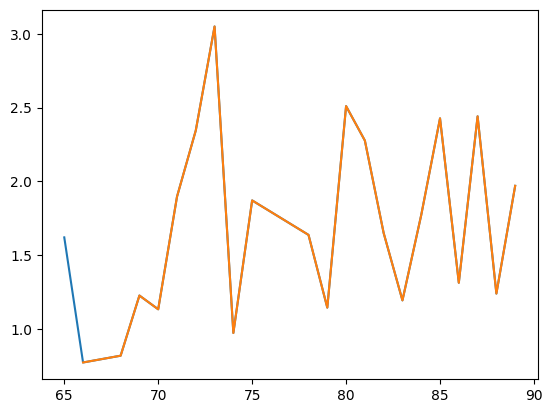

5 15


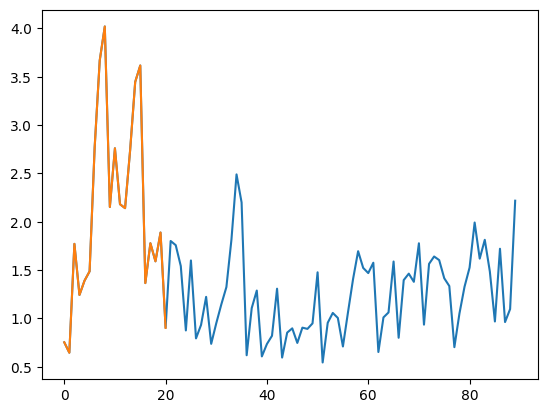

5 15


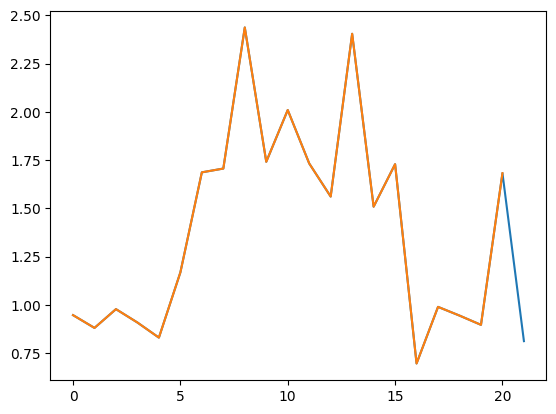

6 16


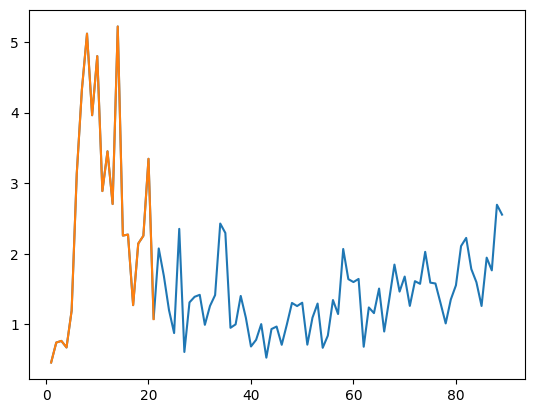

6 16
14 24


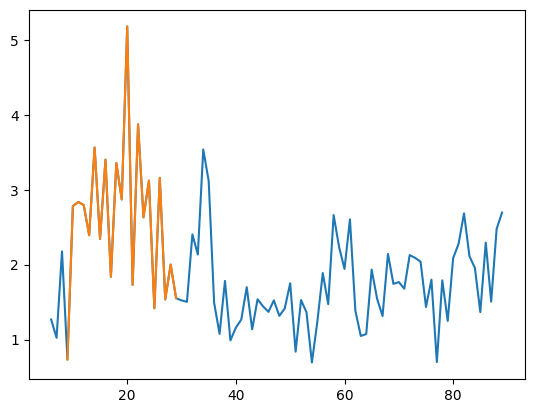

19 29
19 29
19 29
16 26
14 23


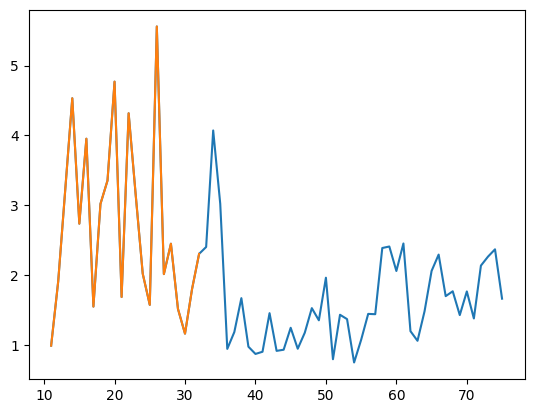

22 32
19 29
28 38
25 35
32 42


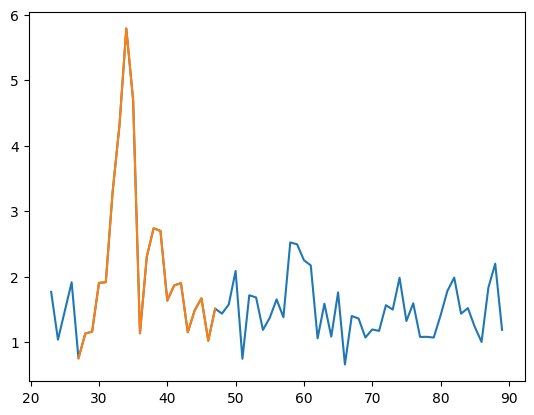

27 37


In [18]:
# Select tracks for plotting 
wave_dynamics = []
mem_dynamics = []
dynamics = []
for c in np.unique(full_t_200.cell):
    t = full_t_200[full_t_200.cell == c]
    t['norm_sig'] = t.norm_wave/t.norm_mem
    for i in np.unique(t.particle):
        cur = t[t.particle == i]
        cur = cur.sort_values('frame')
        if len(cur)>= 20 and cur.norm_sig.max()>2:  
            std,end = get_low_to_high(cur,10,1,1.6,1)
            cur_r = cur[(cur.frame>std)]
            cur_r = cur_r.iloc[0:21]
            if std != -1 and cur_r.norm_sig.max()>2:                
#                 n = len(cur_r[cur_r.norm_sig>1])
                max_wave,std,end = get_top_n_index(cur_r,10)
                print(std,end)
                cur_r = cur[(cur.frame>std-6)]
                cur_r = cur_r.iloc[0:21]
                if len(cur_r) ==21 and std != -1 and cur_r.norm_sig.iloc[0]<=1:
#                     cur_r.frame = cur_r.frame-cur_r.frame.min()
                    plt.plot(cur.frame,cur.norm_sig)
                    plt.plot(cur_r.frame,cur_r.norm_sig)
                    plt.show()
                    dynamics.append(np.array(cur_r.norm_sig))
                    mem_dynamics.append(np.array(cur_r.norm_mem))
                    wave_dynamics.append(np.array(cur_r.norm_wave))

In [19]:
dynamics_200 = np.array(dynamics)

In [20]:
dynamics_200.shape

(99, 21)

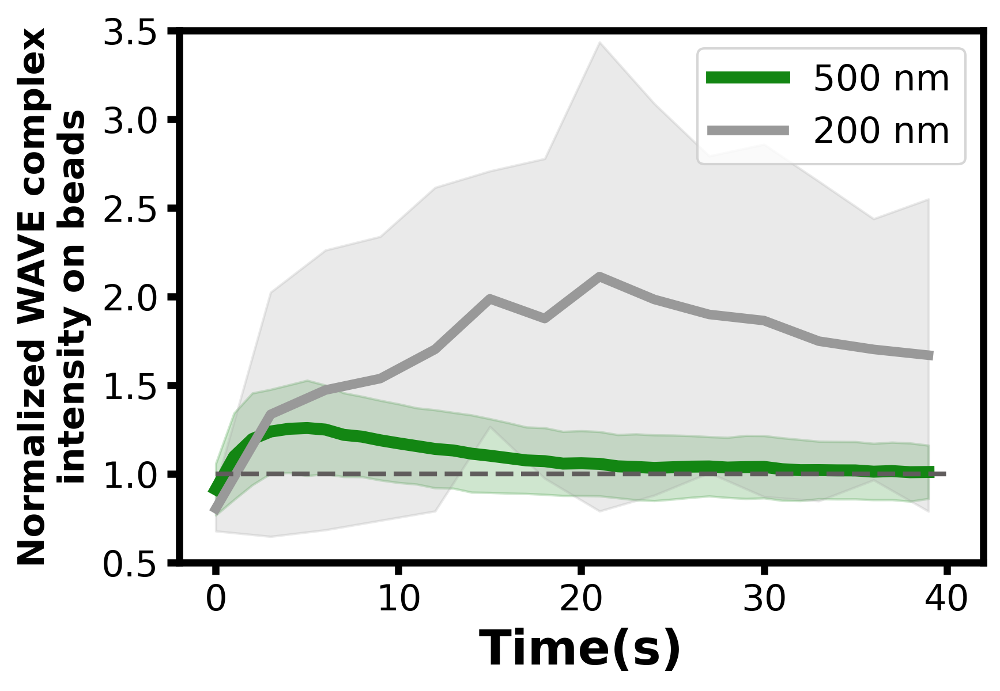

In [21]:
_,ax = plt.subplots(figsize = (6,4),dpi = 300)
ave_500 = dynamics_500.mean(axis = 0)
std_500 = dynamics_500.std(axis =0)
plt.plot(ave_500,lw = 5,c = '#138613',label= '500 nm')
plt.fill_between(np.arange(0,40),ave_500-std_500,ave_500+std_500,alpha = 0.2,color = '#138613')
ave_200 = dynamics_200.mean(axis = 0)[:14]
std_200 = dynamics_200.std(axis =0)[:14]
plt.plot(np.arange(0,41,3),ave_200,lw = 4,c = '#999999',label = '200 nm')
plt.fill_between(np.arange(0,41,3),ave_200-std_200,ave_200+std_200,alpha = 0.2,color = '#999999')
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.hlines(1,0,40,color = '#605c5c',ls = '--',lw = 2)
plt.ylim(0.5,3.5)
plt.xticks(np.arange(0,41,10),size = 15)
plt.yticks(size =15)
plt.legend(fontsize = 15)
plt.xlabel('Time(s)',size = 20,fontweight = 'bold')
# increase tick width
ax.tick_params(width=3,size = 5)
plt.ylabel('Normalized WAVE complex\nintensity on beads',size = 15,fontweight = 'bold')
plt.savefig(PATH + 'result_figures/FigS3C_wave_dynamics_500nm_vs_200nm.png',dpi = 300,bbox_inches = 'tight')

# Generate example time lapse images

In [37]:
example = io.imread(PATH + "example_images/221102_500nm_1s_8_cropped_example.tif")

In [38]:
cell = example[:,:,:,2]

In [39]:
beads = example[:,:,:,1]

t =  0
t =  5
t =  10
t =  15
t =  20
t =  25
t =  30
t =  35


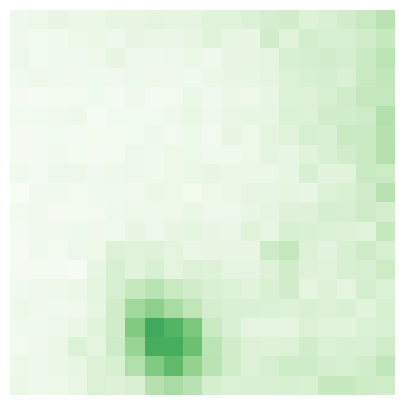

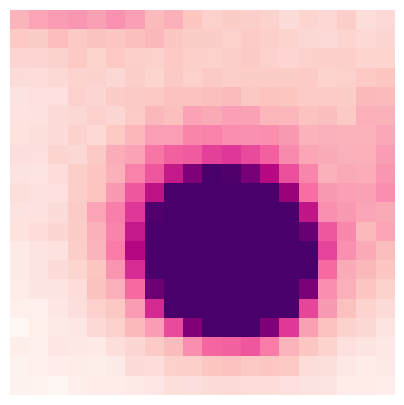

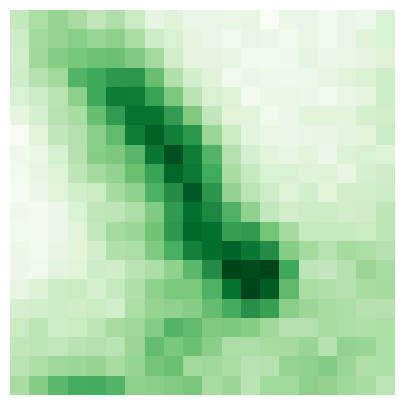

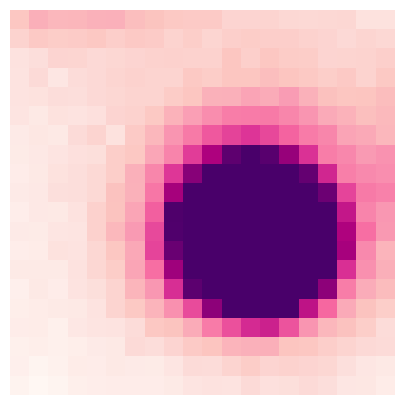

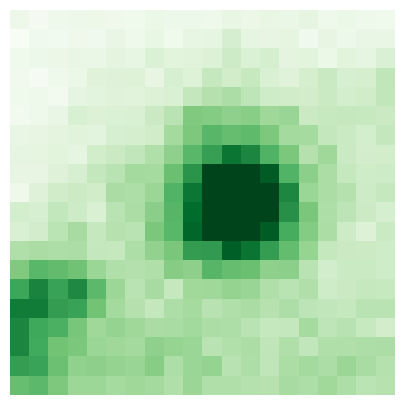

...

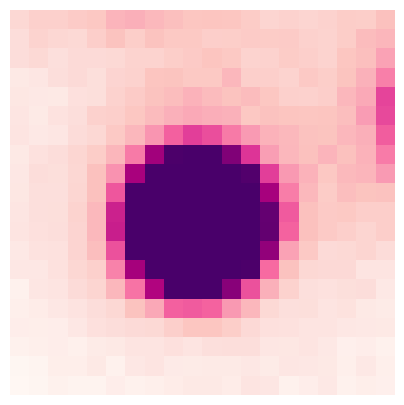

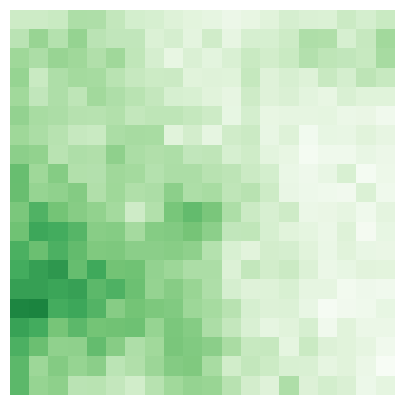

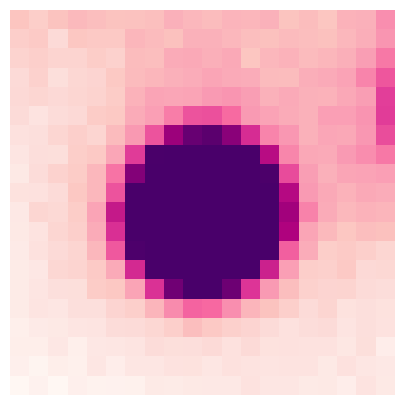

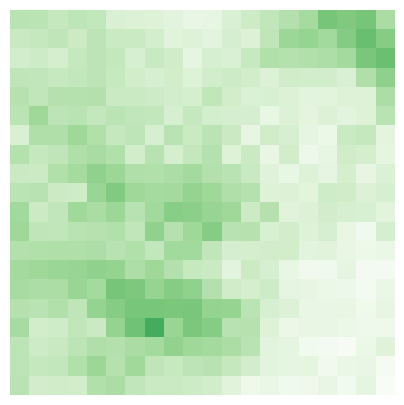

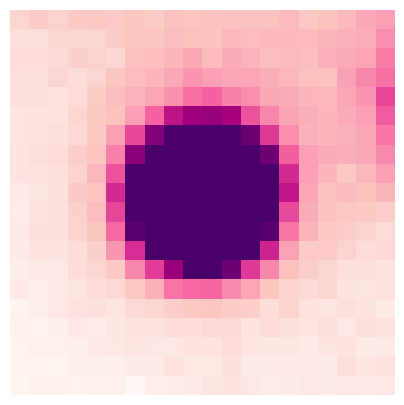

In [41]:
for i in range(25,61,5):
    print("t = ",i-25)
    plt.figure(figsize = (5,5))
    plt.imshow(cell[i],cmap = "Greens",vmax = 1200)
    plt.axis('off')
#     plt.savefig(PATH +'example_images/500nm_wave_'+str(i-25)+"s.png",dpi = 300,bbox_inches = 'tight')
    plt.figure(figsize = (5,5))
    plt.imshow(beads[i],cmap = "RdPu",vmax= 4000)
    plt.axis('off')
#     plt.savefig(PATH +'examples_images/500nm_beads_'+str(i-25)+"s.png",dpi = 300,bbox_inches = 'tight')